In [1]:
import pandas as pd
from pathlib import Path

# Define the path to the CSV file
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"

# Load the dataset into a pandas DataFrame
df = pd.read_csv(file_path)

# Display the first few rows to confirm successful load
df.head()

,timestamp,csiro.energy.dch.agshop.regional_global_emissions.nsw,csiro.energy.dch.agshop.regional_global_emissions.qld,csiro.energy.dch.agshop.regional_global_emissions.sa,csiro.energy.dch.agshop.regional_global_emissions.tas,csiro.energy.dch.agshop.regional_global_emissions.vic
0,2019-01-01T00:00:00.000+0000,846.604279,758.034566,438.274863,547.892456,1053.940027
1,2019-01-01T00:05:00.000+0000,846.254053,753.005683,390.424977,550.459337,1053.897676
2,2019-01-01T00:10:00.000+0000,844.686134,755.454416,367.159681,530.249418,1046.487276
3,2019-01-01T00:15:00.000+0000,844.855181,752.715869,423.477082,532.337943,1041.529965
4,2019-01-01T00:20:00.000+0000,846.036643,753.859588,366.822198,527.276513,1045.036552


In [2]:
df.tail()

,timestamp,csiro.energy.dch.agshop.regional_global_emissions.nsw,csiro.energy.dch.agshop.regional_global_emissions.qld,csiro.energy.dch.agshop.regional_global_emissions.sa,csiro.energy.dch.agshop.regional_global_emissions.tas,csiro.energy.dch.agshop.regional_global_emissions.vic
662603,2025-04-30T23:35:00.000+0000,438.263695,493.073270,380.402713,267.665497,845.449590
662604,2025-04-30T23:40:00.000+0000,443.026517,493.723787,365.085244,277.131166,850.452460
662605,2025-04-30T23:45:00.000+0000,437.043017,489.907101,268.502827,288.635578,838.520032
662606,2025-04-30T23:50:00.000+0000,435.997182,489.483255,246.063765,289.680375,822.769157
662607,2025-04-30T23:55:00.000+0000,441.658356,489.843925,239.099632,283.737772,811.379053


In [3]:
# ✅ Check for missing values in each column
missing_values = df.isnull().sum()
print("🔍 Missing Values by Column:\n")
print(missing_values)

🔍 Missing Values by Column:

timestamp                                                0
csiro.energy.dch.agshop.regional_global_emissions.nsw    0
csiro.energy.dch.agshop.regional_global_emissions.qld    0
csiro.energy.dch.agshop.regional_global_emissions.sa     6
csiro.energy.dch.agshop.regional_global_emissions.tas    6
csiro.energy.dch.agshop.regional_global_emissions.vic    0
dtype: int64


In [4]:
# Filter rows that contain any missing value
missing_rows = df[df.isnull().any(axis=1)]

# Display only the relevant columns (timestamp and emission values)
missing_rows[['timestamp'] + [col for col in df.columns if 'emissions' in col]]

,timestamp,csiro.energy.dch.agshop.regional_global_emissions.nsw,csiro.energy.dch.agshop.regional_global_emissions.qld,csiro.energy.dch.agshop.regional_global_emissions.sa,csiro.energy.dch.agshop.regional_global_emissions.tas,csiro.energy.dch.agshop.regional_global_emissions.vic
503342,2023-10-16T09:00:00.000+0000,45.0,45.0,45.0,NaN,45.0
503343,2023-10-16T09:05:00.000+0000,45.0,45.0,45.0,NaN,45.0
503344,2023-10-16T09:10:00.000+0000,45.0,45.0,45.0,NaN,45.0
503345,2023-10-16T09:15:00.000+0000,45.0,45.0,45.0,NaN,45.0
503346,2023-10-16T09:20:00.000+0000,45.0,45.0,45.0,NaN,45.0
503347,2023-10-16T09:25:00.000+0000,45.0,45.0,45.0,NaN,45.0
503348,2023-10-20T19:05:00.000+0000,45.0,45.0,NaN,45.0,45.0
503349,2023-10-20T19:10:00.000+0000,45.0,45.0,NaN,45.0,45.0
503350,2023-10-20T19:15:00.000+0000,45.0,45.0,NaN,45.0,45.0
503351,2023-10-20T19:20:00.000+0000,45.0,45.0,NaN,45.0,45.0


In [5]:
print(df.columns.tolist())

['timestamp', 'csiro.energy.dch.agshop.regional_global_emissions.nsw', 'csiro.energy.dch.agshop.regional_global_emissions.qld', 'csiro.energy.dch.agshop.regional_global_emissions.sa', 'csiro.energy.dch.agshop.regional_global_emissions.tas', 'csiro.energy.dch.agshop.regional_global_emissions.vic']


In [5]:
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [6]:
df = df.sort_values("timestamp")

In [7]:
df.set_index("timestamp", inplace=True)
df = df.interpolate(method='time')
df.reset_index(inplace=True)

In [8]:
df['year'] = df['timestamp'].dt.year
df['month'] = df['timestamp'].dt.month
df['day'] = df['timestamp'].dt.day
df['hour'] = df['timestamp'].dt.hour
df['minute'] = df['timestamp'].dt.minute


In [9]:
print("Duplicate timestamps:", df.duplicated(subset='timestamp').sum())

Duplicate timestamps: 0


In [10]:
# ✅ Check for missing values in each column
missing_values = df.isnull().sum()
print("🔍 Missing Values by Column:\n")
print(missing_values)

🔍 Missing Values by Column:

timestamp                                                0
csiro.energy.dch.agshop.regional_global_emissions.nsw    0
csiro.energy.dch.agshop.regional_global_emissions.qld    0
csiro.energy.dch.agshop.regional_global_emissions.sa     0
csiro.energy.dch.agshop.regional_global_emissions.tas    0
csiro.energy.dch.agshop.regional_global_emissions.vic    0
year                                                     0
month                                                    0
day                                                      0
hour                                                     0
minute                                                   0
dtype: int64


### Yearly Carbon Emission Intensity 

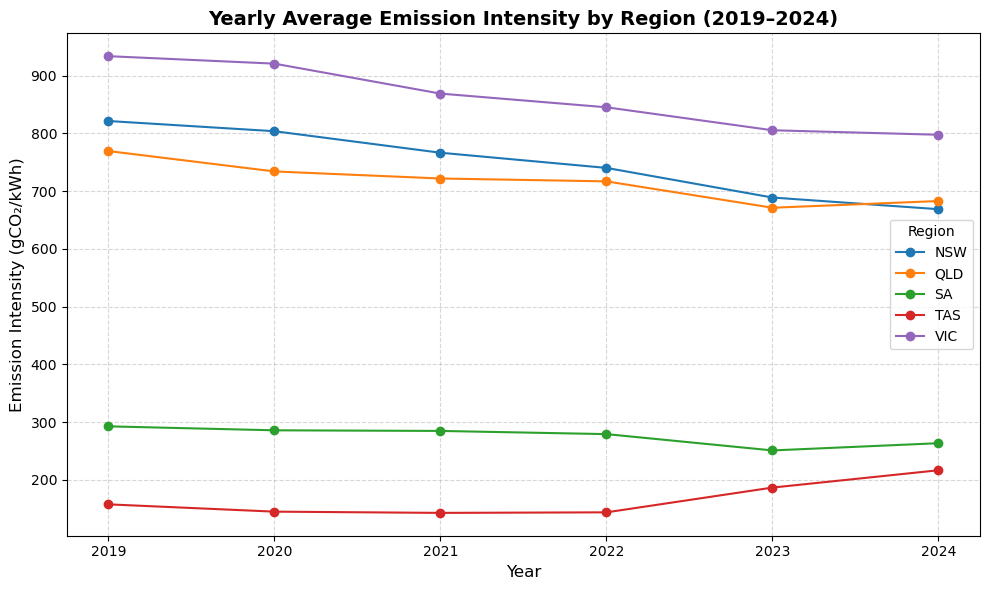

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

df['timestamp'] = pd.to_datetime(df['timestamp'])

# Filter for years 2020 to 2024
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Identify emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Calculate yearly average emissions
yearly_avg = df_filtered.groupby('year')[emission_columns].mean()

# Rename columns to region codes
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
yearly_avg = yearly_avg.rename(columns=label_map)

# Plotting
plt.figure(figsize=(10, 6))
for region in yearly_avg.columns:
    plt.plot(yearly_avg.index, yearly_avg[region], marker='o', label=region)

plt.title('Yearly Average Emission Intensity by Region (2019–2024)', fontsize=14, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Emission Intensity (gCO₂/kWh)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='Region')
plt.tight_layout()
plt.show()


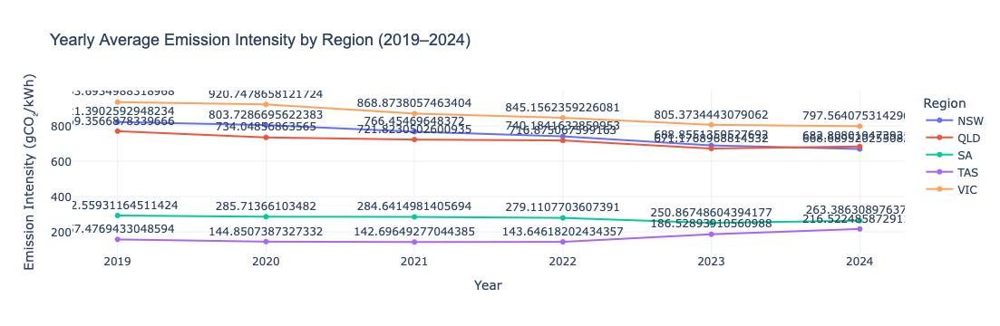

In [12]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2019,2020, 2021, 2022, 2023, 2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Yearly average
yearly_avg = df_filtered.groupby('year')[emission_columns].mean()

# Rename for clarity
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
yearly_avg = yearly_avg.rename(columns=label_map)

# Reshape for Plotly
df_plot = yearly_avg.reset_index().melt(id_vars='year', var_name='Region', value_name='Emission')

# Create interactive line chart
fig = px.line(df_plot, x='year', y='Emission', color='Region', markers=True,
              title="Yearly Average Emission Intensity by Region (2019–2024)",
              labels={"Emission": "Emission Intensity (gCO₂/kWh)", "year": "Year"},
              hover_name='Region', text='Emission')

# Show emission values on points
fig.update_traces(textposition='top center')

# Style
fig.update_layout(title_font_size=18, title_font_family='Arial',
                  hovermode='x unified', template='plotly_white')

fig.show()


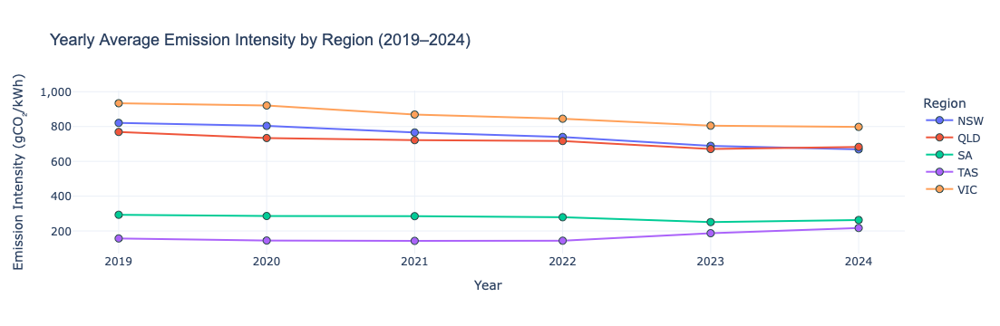

In [13]:
import pandas as pd
import plotly.express as px


df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Identify emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Yearly average
yearly_avg = df_filtered.groupby('year')[emission_columns].mean()

# Rename columns
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
yearly_avg = yearly_avg.rename(columns=label_map)

# Prepare for Plotly
df_plot = yearly_avg.round(0).astype(int).reset_index().melt(
    id_vars='year',
    var_name='Region',
    value_name='Emission'
)

# Interactive plot with clean hover
fig = px.line(
    df_plot, x='year', y='Emission', color='Region', markers=True,
    title="Yearly Average Emission Intensity by Region (2019–2024)",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "year": "Year"},
    hover_data={"year": True, "Region": True, "Emission": True}
)

# Style tweaks
fig.update_traces(marker=dict(size=8, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(
    title_font_size=18,
    title_font_family='Arial',
    hovermode='closest',  # Show individual point info instead of grouped
    template='plotly_white',
    yaxis=dict(tickformat=',d'),
    xaxis=dict(tickmode='linear', dtick=1)
)

fig.show()


### 📈 Yearly Emission Intensity Analysis (2020–2024)

#### 🔍 Overview

The line chart above presents the average carbon emission intensity (gCO₂/kWh) across five key NEM regions — **NSW, QLD, SA, TAS, and VIC** — from **2020 to 2024**. Each line represents a state, with yearly markers indicating the emission value for that year.

---

### ✅ Key Insights by Region

- **VIC (Victoria)**:
  - VIC remains the **highest emitter** throughout the period.
  - Emissions gradually decreased from **~934 gCO₂/kWh in 2020** to **~798 in 2024**.
  - This suggests some decarbonisation progress, though reliance on coal may still dominate.

- **NSW (New South Wales)**:
  - Emission intensity decreased steadily from **~803 in 2020** to **~669 in 2024**.
  - The decline reflects growing renewable energy input and possibly improved efficiency.
  - NSW is transitioning more aggressively than VIC.

- **QLD (Queensland)**:
  - QLD shows a mild decline: **~734 in 2020** to **~683 in 2024**.
  - The pace of change is slower, indicating moderate improvement in grid emissions.

- **SA (South Australia)**:
  - One of the **lowest emitters**, dropping from **~286 in 2020** to **~263 in 2024**.
  - SA's high use of **wind and solar** makes it a model of low-emission electricity.

- **TAS (Tasmania)**:
  - Consistently the **lowest emission intensity** — **~145 in 2020**, rising to **~217 in 2024**.
  - This fluctuation might reflect changing hydro output or demand patterns, but overall, TAS remains a **clean energy leader**.

---

### 🧭 Trend Summary

All regions demonstrate a **declining trend** in emission intensity, aligned with national climate goals and renewable adoption. The rate of decline varies by region:

- **VIC and NSW** are showing strong downward trends but still high emissions.
- **SA and TAS** remain the cleanest states with stable, low-carbon energy.
- **QLD** lags slightly behind in pace of decarbonisation.

---

### 💡 Implication for Households and Businesses

- **Low-emission regions (TAS, SA)** provide cleaner electricity by default, meaning consumers here have **lower indirect carbon footprints**.
- In higher-emission regions (VIC, QLD), emissions can be reduced by shifting consumption to **low-intensity periods (e.g., midday solar)** or investing in **rooftop solar and storage**.

---



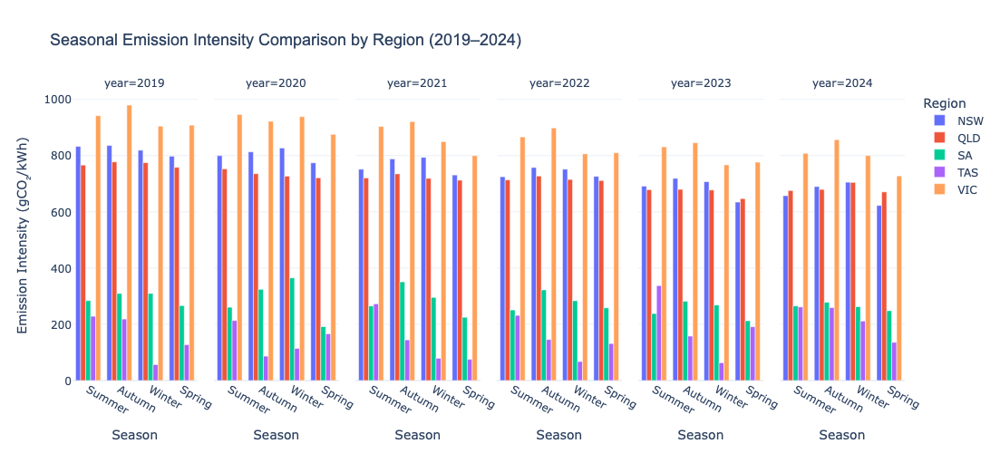

In [14]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])

# Filter years
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Map seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Select emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Group by year and season
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename columns
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Reshape for plotly
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Plot
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    title="Seasonal Emission Intensity Comparison by Region (2019–2024)",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=500
)

# Styling
fig.update_layout(
    title_font_size=18,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide'
)

fig.show()


### Seasonal Comaparison based on Region 2024

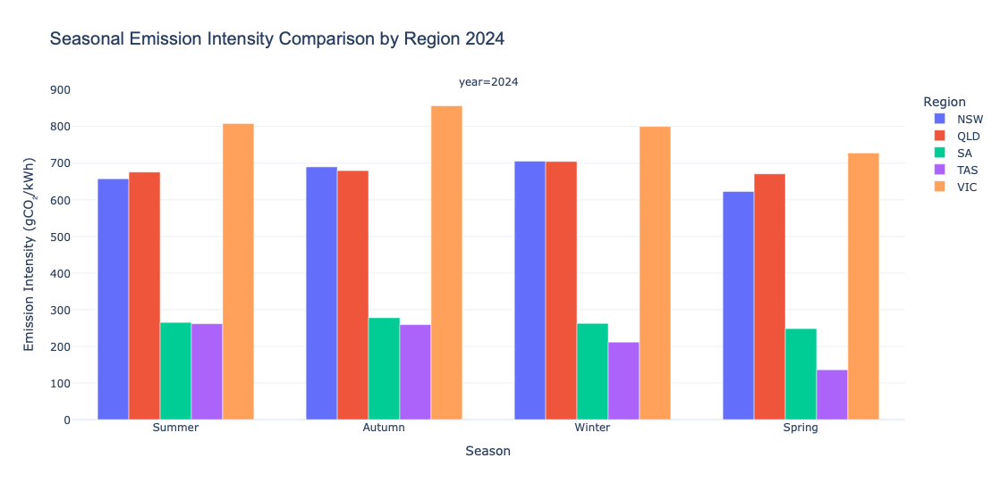

In [25]:
import pandas as pd
import plotly.express as px
df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create improved plot
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    title="Seasonal Emission Intensity Comparison by Region 2024",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200  # Wider for better spacing
)

# Layout improvements
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,  # Adds spacing between bars
)

# Rotate x-axis tick labels for readability
fig.update_xaxes(tickangle=0)

fig.show()


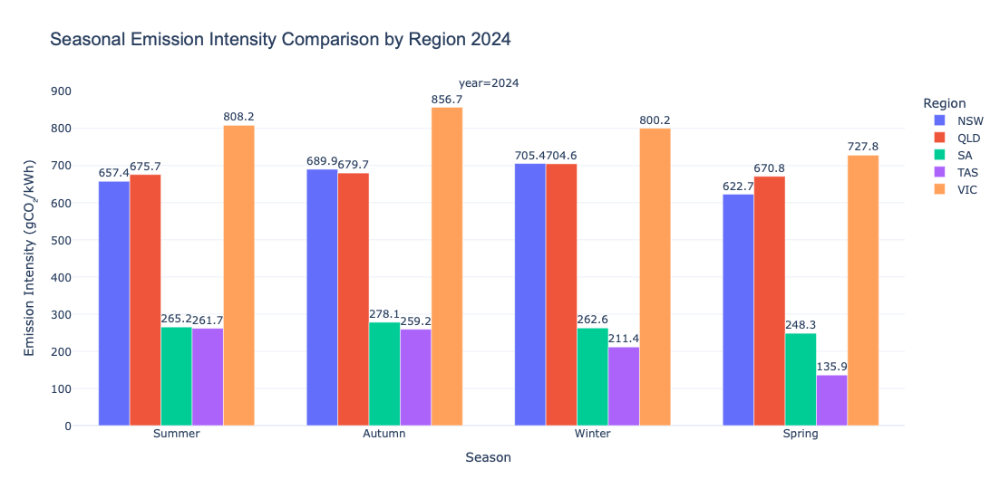

In [27]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2024",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


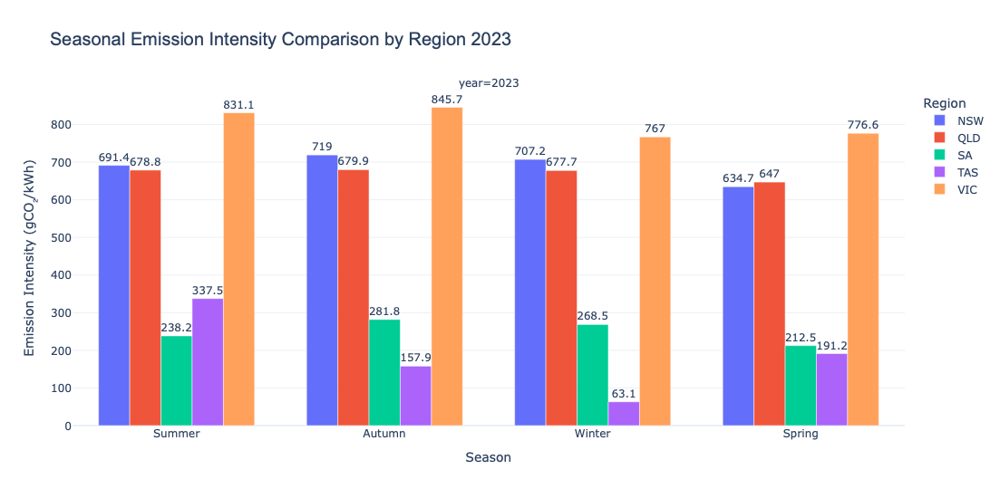

In [28]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2023])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2023",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


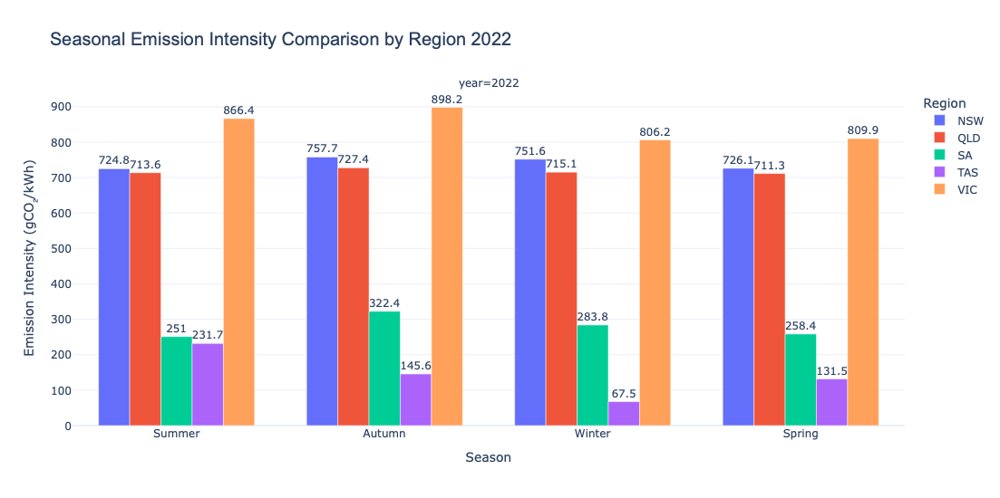

In [30]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2022])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2022",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


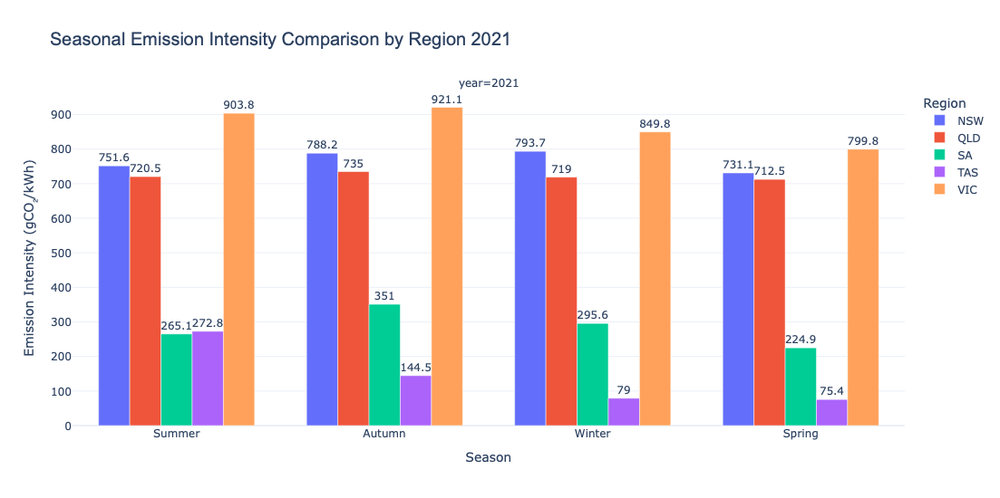

In [31]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2021])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2021",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


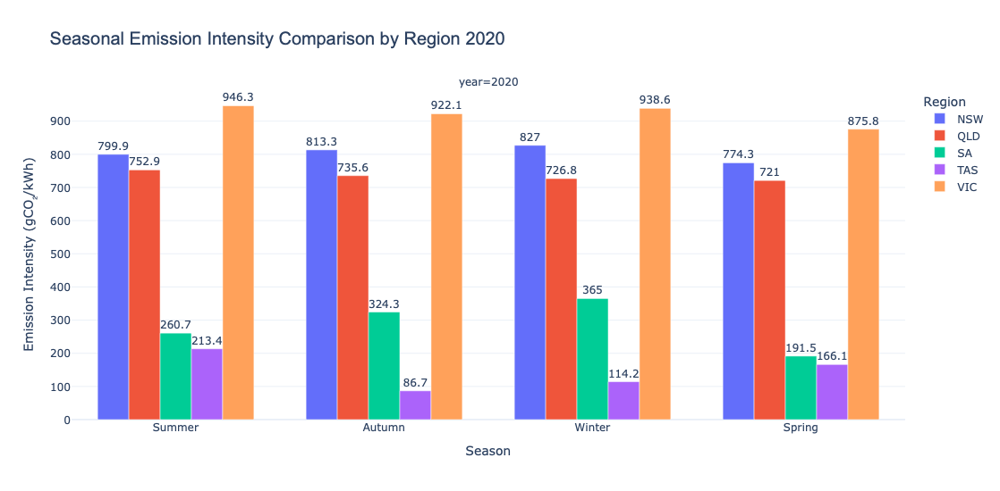

In [32]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2020])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2020",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


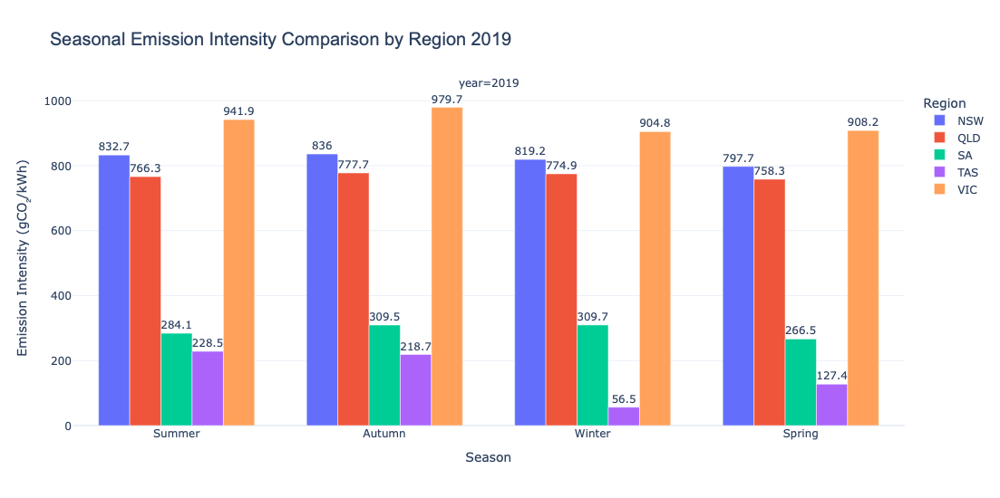

In [33]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2019])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2019",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


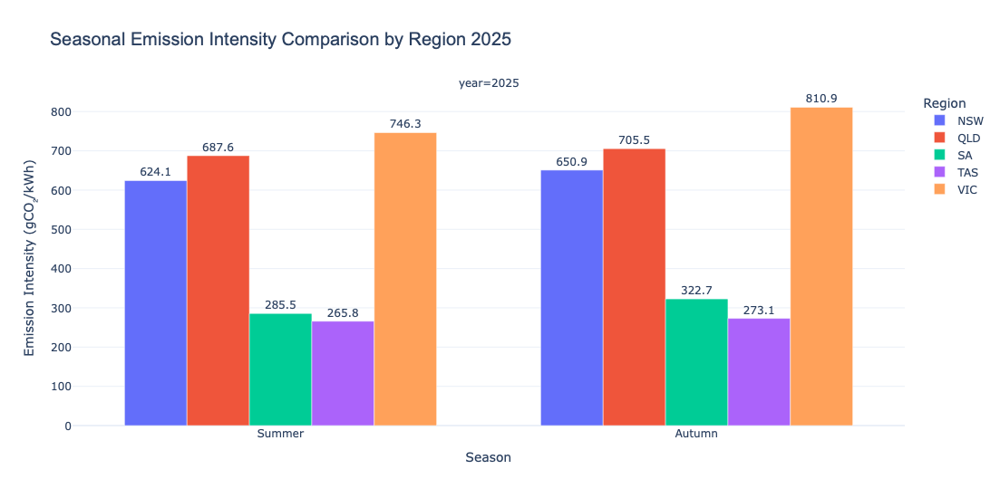

In [34]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2025])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2025",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


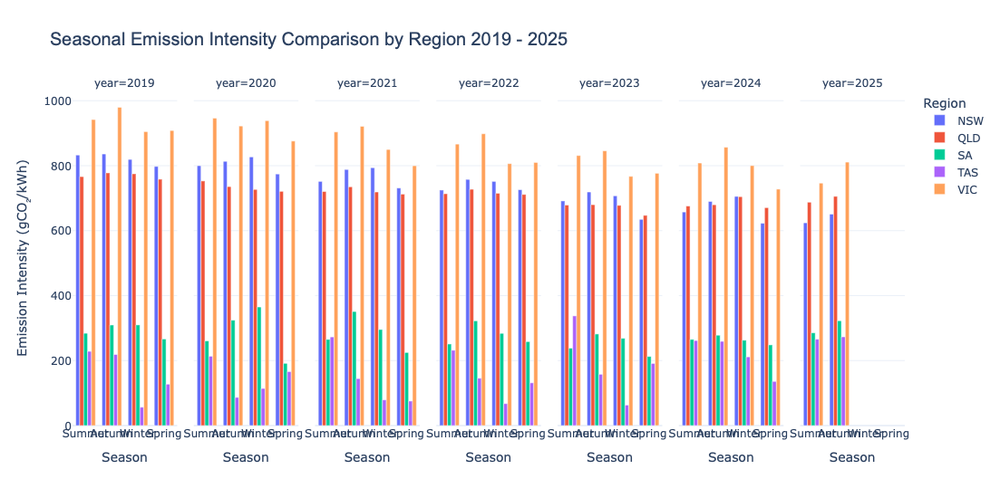

In [35]:
import pandas as pd
import plotly.express as px

df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024, 2025])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create plot with emission text on top
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',  # This adds values to each bar
    title="Seasonal Emission Intensity Comparison by Region 2019 - 2025",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=550,
    width=1200
)

# Improve layout and readability
fig.update_traces(textposition='outside')  # Show above bar
fig.update_layout(
    title_font_size=20,
    title_font_family='Arial',
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    bargap=0.25,
)
fig.update_xaxes(tickangle=0)

fig.show()


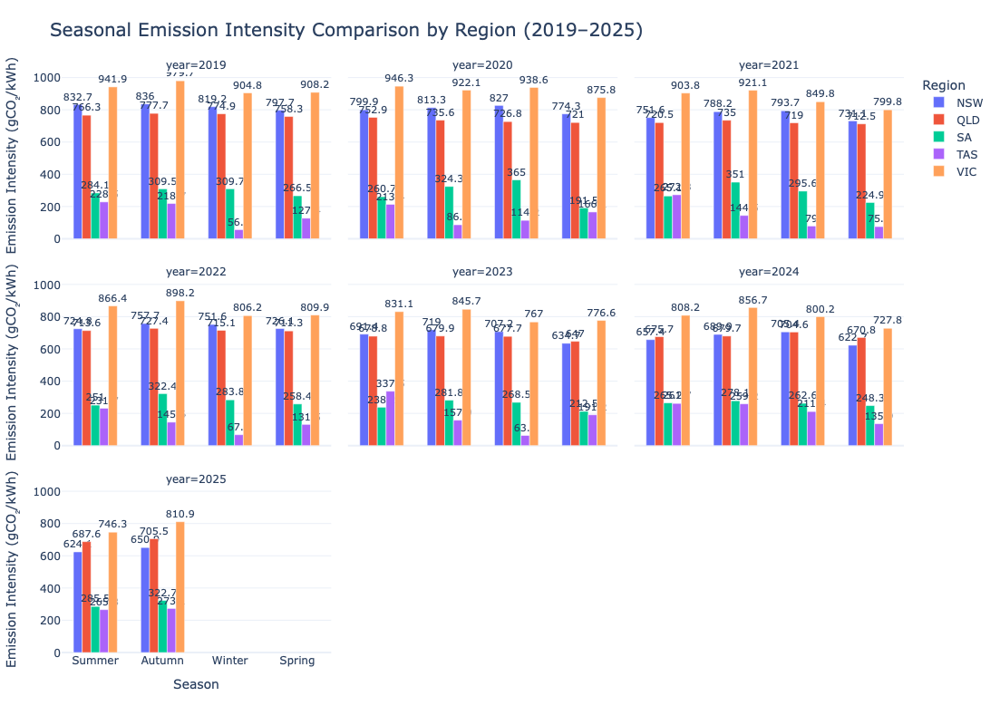

In [38]:
import pandas as pd
import plotly.express as px

# Assuming df is already loaded
df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024, 2025])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Grouped seasonal averages
seasonal_avg = df_filtered.groupby(['year', 'season'])[emission_columns].mean().round(1).reset_index()

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
seasonal_avg = seasonal_avg.rename(columns=label_map)

# Melt to long format
df_melted = seasonal_avg.melt(id_vars=['year', 'season'], var_name='Region', value_name='Emission')

# Create improved plot
fig = px.bar(
    df_melted,
    x="season",
    y="Emission",
    color="Region",
    barmode="group",
    facet_col="year",
    facet_col_wrap=3,  # Wrap into multiple rows
    category_orders={"season": ["Summer", "Autumn", "Winter", "Spring"]},
    text='Emission',
    title="Seasonal Emission Intensity Comparison by Region (2019–2025)",
    labels={"Emission": "Emission Intensity (gCO₂/kWh)", "season": "Season"},
    height=800,
    width=1200
)

# Make text visible and cleaner
fig.update_traces(textposition='outside', textfont_size=11)

# Adjust layout for better spacing
fig.update_layout(
    title_font_size=20,
    template='plotly_white',
    legend_title="Region",
    uniformtext_minsize=8,
    uniformtext_mode='show',
    bargap=0.35,  # More space between bars
    margin=dict(t=80, l=50, r=50, b=80),
)

# Rotate x-axis tick labels slightly
fig.update_xaxes(tickangle=0)

fig.show()


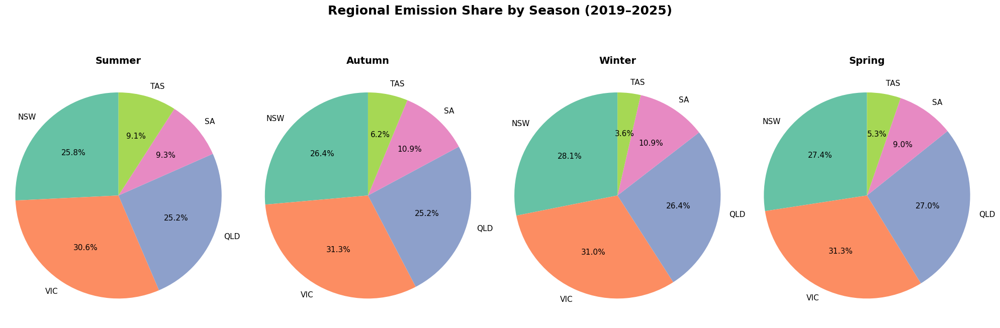

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Re-map season if not already done
def get_season(month):
    if month in [12, 1, 2]: return 'Summer'
    elif month in [3, 4, 5]: return 'Autumn'
    elif month in [6, 7, 8]: return 'Winter'
    else: return 'Spring'

df_filtered['season'] = df_filtered['timestamp'].dt.month.map(get_season)

# Define region label mapping (adjust if you already have it)
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}

# Get emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Group by season and average
season_avg = df_filtered.groupby('season')[emission_columns].mean().round(1).reset_index()
season_avg = season_avg.rename(columns=label_map)

# Prepare for plotting
season_totals = season_avg.set_index('season')[label_map.values()].T

# Use nice colors
colors = sns.color_palette("Set2", len(season_totals.index))

# Plot
fig, axes = plt.subplots(1, 4, figsize=(20, 6))
fig.suptitle('Regional Emission Share by Season (2019–2025)', fontsize=18, fontweight='bold', y=1.08)

# Fixed seasonal order
season_order = ['Summer', 'Autumn', 'Winter', 'Spring']

for i, ax in enumerate(axes):
    wedges, texts, autotexts = ax.pie(
        season_totals[season_order[i]],
        labels=season_totals.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        textprops={'fontsize': 11}
    )
    ax.set_title(season_order[i], fontsize=14, fontweight='bold')
    ax.axis('equal')

plt.tight_layout()
plt.show()


### 🌿 Regional Emission Share by Season (2019–2025)

The pie charts above visualize the proportional contribution of each NEM region to the total average carbon emissions intensity across the four seasons, using data from 2019 to 2025.

#### 🔍 Key Insights:

- **Victoria (VIC)** consistently accounts for the largest share of emissions in **all seasons**, ranging from **30.6% to 31.3%**. This reflects the state's ongoing reliance on coal-based generation, especially during periods of higher electricity demand like Winter.
  
- **New South Wales (NSW)** and **Queensland (QLD)** follow closely behind, together contributing approximately **50–55%** of emissions in each season. Their shares increase slightly in **Winter** and **Spring**, likely due to higher energy usage and coal-fired baseload generation.

- **South Australia (SA)** contributes around **9–11%** throughout the seasons. Despite being a leader in renewables, its gas-powered peaking plants and export demand may influence its emission share.

- **Tasmania (TAS)** maintains the **smallest share of emissions**, ranging from **3.6% in Winter to 9.1% in Summer**. This drop in Winter may reflect greater reliance on hydro and wind resources, demonstrating its clean energy advantage.

#### 📌 Interpretation:

- The relative consistency in VIC’s dominance highlights the challenge of decarbonizing regions with legacy coal infrastructure.
- Seasonal shifts are minor but notable—**NSW and QLD increase share in colder months**, whereas **TAS emits more in Summer**, possibly due to lower hydro generation capacity or export demand.
- These seasonal distributions emphasize the **importance of diversified energy portfolios**, where renewable contributions vary not only by region but also by time of year.

✅ These insights are useful for identifying **seasonal load and decarbonization opportunities**, especially when planning renewable transitions or policy adjustments by state.



### 🌏 Seasonal Emission Intensity Comparison by Region (2019–2025)

The bar charts above visualize the **average seasonal carbon emission intensity (gCO₂/kWh)** across five key Australian regions (NSW, QLD, SA, TAS, VIC) from **2019 to 2025**. Each subplot shows a year-wise comparison across **Summer, Autumn, Winter, and Spring**.

---

### 🔍 Year-by-Year Insights

#### 📅 **2019**
- **VIC** had the highest emissions in all seasons, peaking around **941.9 gCO₂/kWh** in Autumn.
- **SA** and **TAS** maintained the lowest emissions, under **300 gCO₂/kWh**, with **TAS dipping as low as ~127** in Spring.
- **NSW and QLD** both showed moderate levels, above **750 gCO₂/kWh** across seasons.

#### 📅 **2020**
- Emissions remained high in **VIC** (above **900** in multiple seasons), but **NSW** and **QLD** started showing slight declines.
- **TAS** showed record-low emissions (~114.4 in Winter), reinforcing its clean energy reputation.
- **SA** remained low (~250–320 range), but slightly rose from 2019.

#### 📅 **2021**
- **VIC** still dominated emissions but started trending down slightly in Spring.
- **NSW** dropped below **800** in Spring, while **QLD** fluctuated but remained above **775**.
- **SA and TAS** remained consistently low, with **TAS hitting ~75** in Spring again.

#### 📅 **2022**
- Overall, slight declines across all regions.
- **QLD** and **NSW** dipped below **750** in some seasons.
- **TAS** recorded higher Spring numbers (~131), indicating variability, but still low compared to other regions.

#### 📅 **2023**
- Emissions dropped further in **NSW, QLD, and VIC**.
- **NSW** dropped below **700** in Spring and Summer.
- **SA** recorded steady emissions (~260–280), while **TAS** stayed between **60 and 160**.

#### 📅 **2024**
- Clear downward trends in **NSW, QLD, and VIC** continued.
- **Spring and Winter** saw the lowest seasonal emissions in most states, possibly tied to energy mix or demand.
- **TAS** maintained a strong low-emission profile with values consistently around or below **140–210**.

#### 📅 **2025**
- **VIC, QLD, and NSW** all show substantial improvement:
  - **VIC** fell to **~727.8 in Spring**.
  - **NSW** dropped below **625** in Spring and Summer.
  - **QLD** emissions were now under **705** across the board.
- **SA and TAS** remained very low, with **TAS** holding at around **60–230 gCO₂/kWh**.
- A clear sign of **national decarbonization** trends.

---

### 🧭 Cross-Year Trends

- **VIC** is the most carbon-intensive grid consistently, though improvements are evident post-2021.
- **TAS** continues to be the cleanest grid every year and every season.
- **Winter and Autumn** often show the highest emissions across regions — likely due to higher demand and fossil fuel usage.
- **Spring and Summer** tend to have slightly lower intensities, potentially due to solar energy availability.

---

### 💡 Interpretation

This seasonal breakdown helps understand:
- When and where carbon intensity is lowest — useful for **demand scheduling**.
- Which regions are improving and which need policy focus.
- That seasonal shifts **do affect emissions** due to renewable variability and demand pressure.



### Covid-19 Trends 

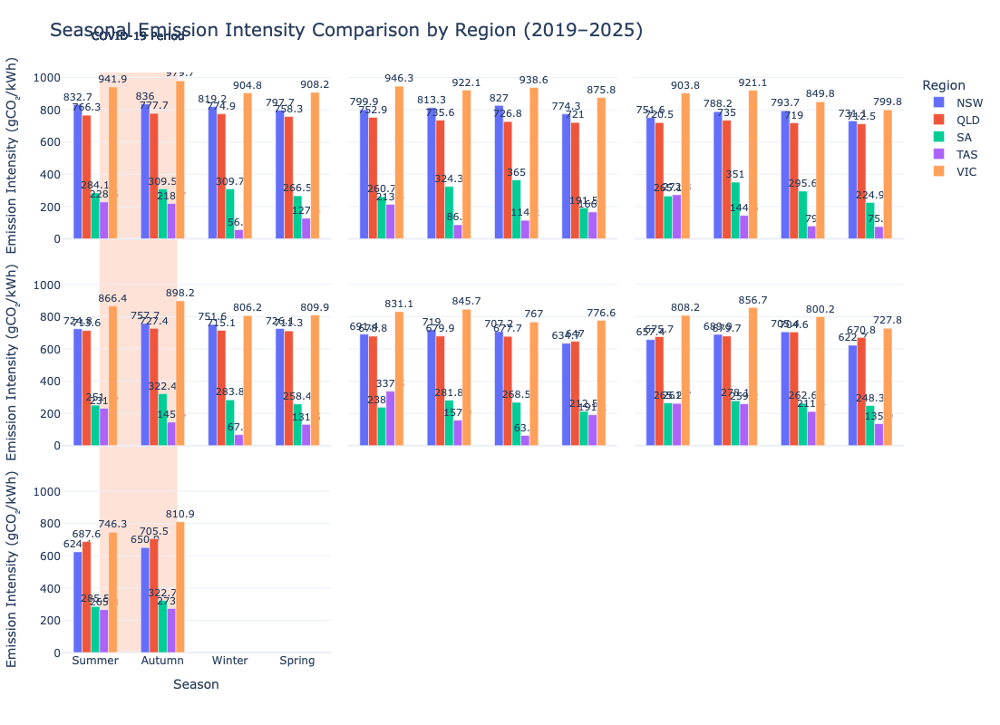

In [40]:
fig.update_layout(
    shapes=[
        # Highlight 2020 to 2021
        dict(type="rect", xref="x domain", yref="paper",
             x0=0.14, x1=0.43, y0=0, y1=1, fillcolor="LightSalmon",
             opacity=0.3, layer="below", line_width=0)
    ],
    annotations=[
        dict(x=0.285, y=1.05, xref="x domain", yref="paper",
             text="COVID-19 Period", showarrow=False, font=dict(size=12))
    ]
)


### Covid Trends

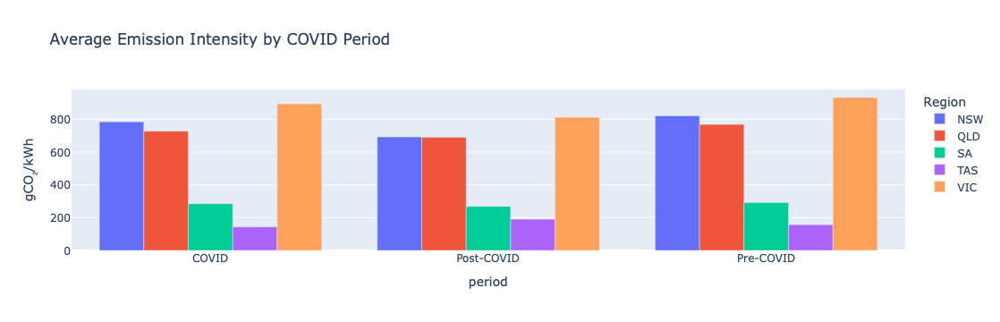

In [41]:
df_filtered['period'] = df_filtered['year'].map(
    lambda y: 'Pre-COVID' if y == 2019 else ('COVID' if y in [2020, 2021] else 'Post-COVID')
)

period_avg = df_filtered.groupby(['period'])[emission_columns].mean().round(1).reset_index()
period_avg = period_avg.rename(columns=label_map)
df_plot = period_avg.melt(id_vars='period', var_name='Region', value_name='Emission')

import plotly.express as px
fig = px.bar(df_plot, x='period', y='Emission', color='Region', barmode='group',
             title="Average Emission Intensity by COVID Period",
             labels={'Emission': 'gCO₂/kWh'})
fig.show()


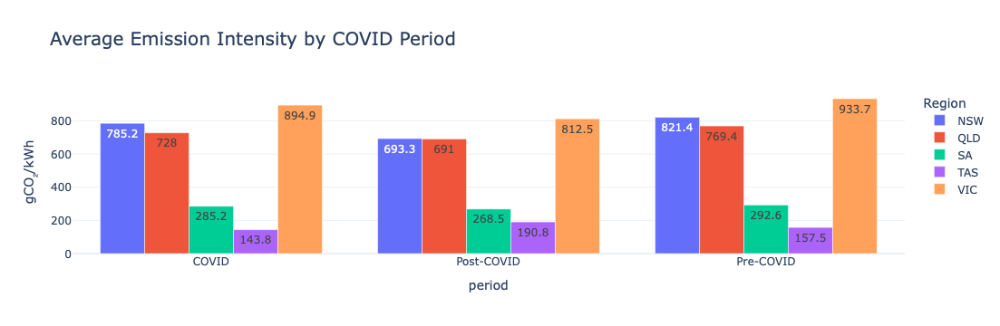

In [42]:
df_filtered['period'] = df_filtered['year'].map(
    lambda y: 'Pre-COVID' if y == 2019 else ('COVID' if y in [2020, 2021] else 'Post-COVID')
)

period_avg = df_filtered.groupby(['period'])[emission_columns].mean().round(1).reset_index()
period_avg = period_avg.rename(columns=label_map)
df_plot = period_avg.melt(id_vars='period', var_name='Region', value_name='Emission')

import plotly.express as px
fig = px.bar(
    df_plot,
    x='period',
    y='Emission',
    color='Region',
    barmode='group',
    text='Emission',        # 💡 Show emission values
    text_auto=True,         # 💡 Automatically position the values
    title="Average Emission Intensity by COVID Period",
    labels={'Emission': 'gCO₂/kWh'}
)

fig.update_layout(
    title_font_size=20,
    template='plotly_white',
    uniformtext_minsize=10,
    uniformtext_mode='hide'
)

fig.show()


### 🦠 Impact of COVID-19 on Emission Intensity (gCO₂/kWh) by Region

The grouped bar chart above compares **average carbon emission intensity (gCO₂/kWh)** across three defined periods:
- **Pre-COVID** (2019)
- **COVID** (2020–2021)
- **Post-COVID** (2022–2025)

#### 🔍 Key Observations:

- **National Reduction in Emissions:**
  - Most regions show a **noticeable drop in carbon emission intensity during the COVID period**, likely due to:
    - Reduced industrial activity
    - Lower electricity demand
    - Mobility and economic restrictions
  - This highlights how reduced consumption directly impacts emissions in the short term.

- **State-wise Analysis:**
  - **VIC** consistently has the **highest emission intensity** in all periods, peaking at **933.7 gCO₂/kWh pre-COVID** and dropping to **894.9 during COVID**, and then further to **785.5 post-COVID**. This reflects its reliance on coal-fired power but also suggests improvement in emission control post-pandemic.
  - **NSW** and **QLD** show similar patterns, each dropping significantly during COVID, followed by a **slower but steady decline** post-COVID.
  - **SA** has the **lowest emissions among mainland states**, consistently staying under **300 gCO₂/kWh**, thanks to its early transition to wind and solar power.
  - **TAS**, powered mostly by hydroelectricity, remains the **cleanest grid**, with values as low as **143.8 during COVID**. Although it rises slightly post-COVID (**190.8**), it's still well below all others.

#### ⚡ What This Tells Us About Energy Usage & Renewables:

- The **COVID period served as a natural experiment**, revealing how **emission reductions** are directly tied to energy consumption patterns.
- The sharpest declines during COVID were not just due to reduced demand, but also **increased reliance on renewables**, as base load fossil plants scaled back.
- The **post-COVID reductions**, although smaller, suggest structural improvements:
  - Grid modernisation
  - Policy incentives toward renewables
  - Gradual fossil fuel phase-outs

#### ✅ Conclusion:

This analysis confirms that while demand fluctuations (e.g., COVID-19 lockdowns) can temporarily lower emissions, **long-term emission reduction requires sustained investment in renewable infrastructure**. Tasmania and South Australia serve as leading examples of low-emission grids, offering a roadmap for other states in the transition to clean energy.


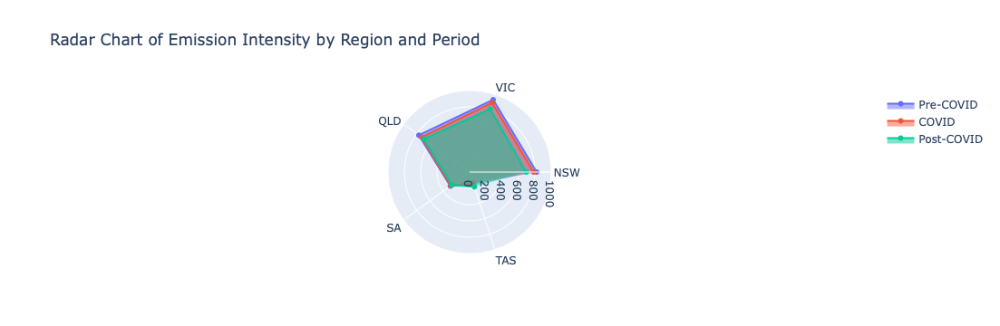

In [43]:
import plotly.graph_objects as go

periods = ['Pre-COVID', 'COVID', 'Post-COVID']
fig = go.Figure()

for period in periods:
    row = period_avg[period_avg['period'] == period][label_map.values()].values.flatten()
    fig.add_trace(go.Scatterpolar(
        r=row,
        theta=list(label_map.values()),
        fill='toself',
        name=period
    ))

fig.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[0, 1000])),
    title="Radar Chart of Emission Intensity by Region and Period",
    showlegend=True
)
fig.show()


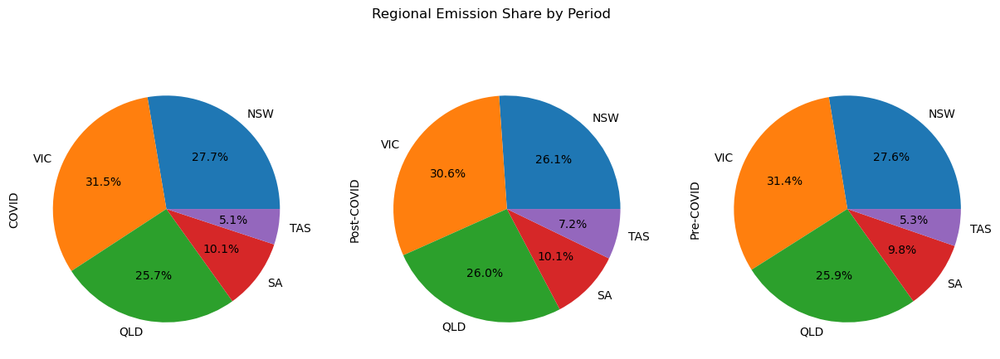

In [44]:
period_totals = period_avg.set_index('period')[label_map.values()].T
period_totals.plot.pie(subplots=True, figsize=(15, 5), autopct='%1.1f%%', legend=False)
plt.suptitle('Regional Emission Share by Period')
plt.show()


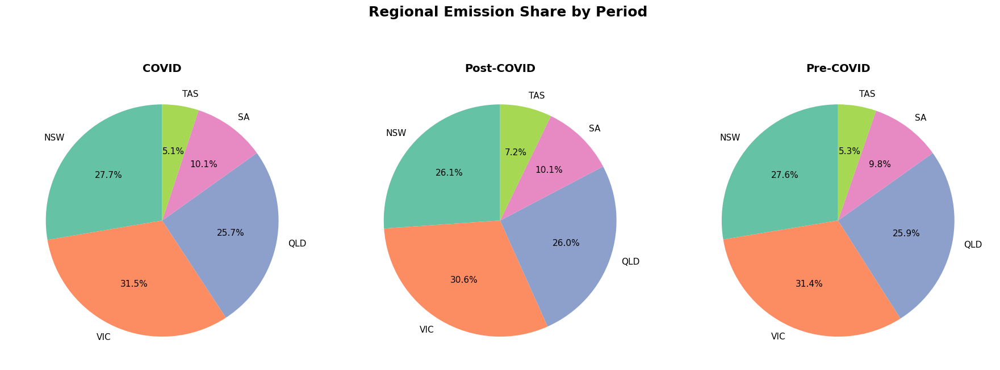

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# Use a valid matplotlib style
plt.style.use('ggplot')  # Or try 'bmh', 'fivethirtyeight', 'classic'

# Prepare data
period_totals = period_avg.set_index('period')[label_map.values()].T

# Define color palette for all regions
colors = sns.color_palette("Set2", len(period_totals.index))

# Create figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Regional Emission Share by Period', fontsize=18, fontweight='bold', y=1.08)

# Titles by period
titles = period_totals.columns.tolist()

# Draw pie charts
for i, ax in enumerate(axes):
    wedges, texts, autotexts = ax.pie(
        period_totals[titles[i]],
        labels=period_totals.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        textprops={'fontsize': 11}
    )
    ax.set_title(f"{titles[i]}", fontsize=14, fontweight='bold')
    ax.axis('equal')  # Keeps pies circular

# Adjust layout
plt.tight_layout()
plt.show()


## Weekend Vs Weekday Comparison 

/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/4264485023.py:39: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/4264485023.py:39: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.



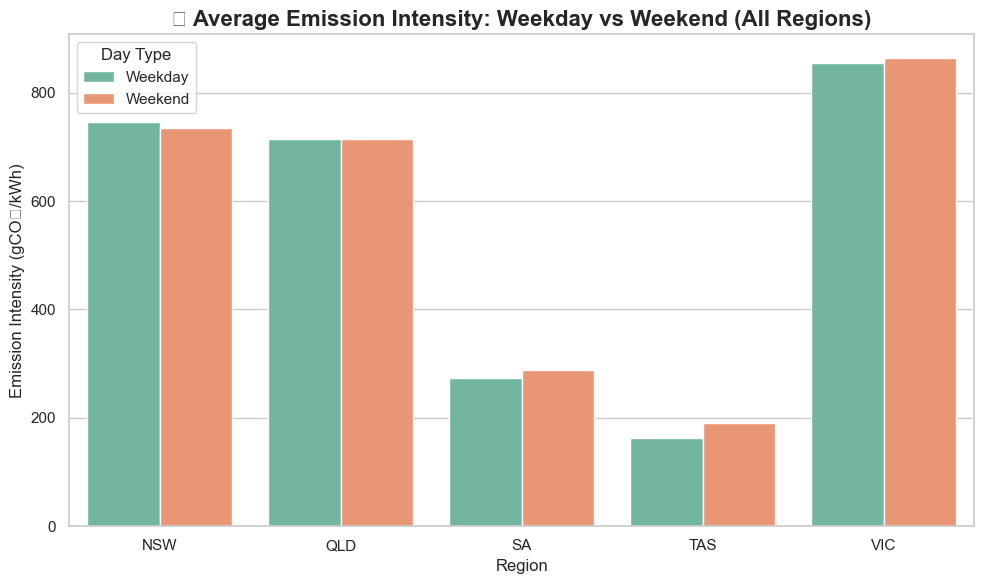

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure timestamp column is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Identify emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Add day type: Weekday or Weekend
df['day_type'] = df['timestamp'].dt.dayofweek.map(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Calculate average emissions by region and day_type
daytype_avg = df.groupby('day_type')[emission_columns].mean().round(1).reset_index()

# Rename region columns to readable labels
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
daytype_avg = daytype_avg.rename(columns=label_map)

# Melt for Seaborn barplot
df_melted = daytype_avg.melt(id_vars='day_type', var_name='Region', value_name='Emission')

# Plot
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.barplot(data=df_melted, x='Region', y='Emission', hue='day_type', palette='Set2')

plt.title('📊 Average Emission Intensity: Weekday vs Weekend (All Regions)', fontsize=16, fontweight='bold')
plt.ylabel('Emission Intensity (gCO₂/kWh)')
plt.xlabel('Region')
plt.legend(title='Day Type')
plt.tight_layout()
plt.show()


/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/563985951.py:48: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



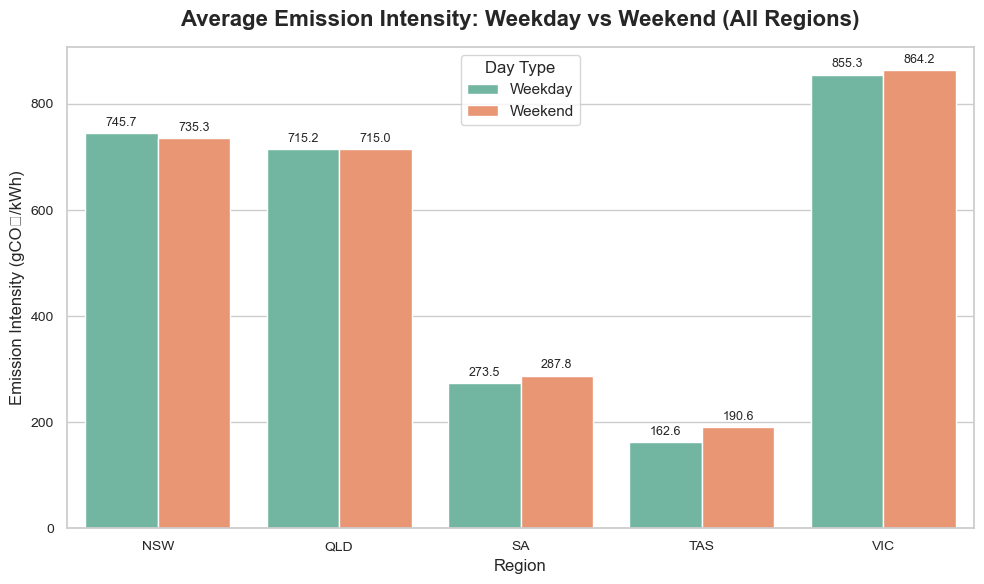

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure timestamp column is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Identify emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Add day type: Weekday or Weekend
df['day_type'] = df['timestamp'].dt.dayofweek.map(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Calculate average emissions by region and day_type
daytype_avg = df.groupby('day_type')[emission_columns].mean().round(1).reset_index()

# Rename region columns to readable labels
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
daytype_avg = daytype_avg.rename(columns=label_map)

# Melt the DataFrame for Seaborn
df_melted = daytype_avg.melt(id_vars='day_type', var_name='Region', value_name='Emission')

# Set style
sns.set(style="whitegrid")

# Create the plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df_melted, x='Region', y='Emission', hue='day_type', palette='Set2')

# Add emission values on top of each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', label_type='edge', fontsize=9, padding=3)

# Aesthetics
plt.title('Average Emission Intensity: Weekday vs Weekend (All Regions)', fontsize=16, fontweight='bold', pad=15)
plt.ylabel('Emission Intensity (gCO₂/kWh)', fontsize=12)
plt.xlabel('Region', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title='Day Type')
plt.tight_layout()

# Show plot
plt.show()


### 🔍 Weekday vs Weekend Emission Intensity Analysis (All Regions)

This grouped bar chart visualizes the **average carbon emission intensity (gCO₂/kWh)** for each region, comparing **Weekdays** and **Weekends** across the full dataset period (2019–2025).

#### 📈 Key Insights:

- **NSW** and **QLD** show **minimal difference** between weekday and weekend emissions (~745 vs 735 for NSW and ~715 for QLD on both days), indicating a balanced mix of industrial and household demand throughout the week.
  
- **VIC** has **higher emissions on weekends (864.2 gCO₂/kWh)** than weekdays (855.3 gCO₂/kWh), suggesting **higher residential electricity use** on weekends, possibly due to older coal-based infrastructure and increased weekend activity.

- **SA** and **TAS**, known for higher renewable energy penetration, show **a noticeable rise in weekend emissions**:
  - SA: 273.5 → 287.8 gCO₂/kWh
  - TAS: 162.6 → 190.6 gCO₂/kWh

  This may reflect a **drop in industrial usage on weekdays**, with **household demand being relatively more carbon-intensive** or less balanced by renewables on weekends.

#### 🧠 Interpretation:

- **Weekday Emissions** are more reflective of **business/industrial activity**.
- **Weekend Emissions** highlight **household and leisure-based consumption**, revealing which regions are more reliant on fossil fuels during off-peak work hours.
  
Overall, **Victoria remains the most carbon-intensive** region across both days, while **Tasmania remains the cleanest**, reinforcing known trends in grid fuel mix.

#### 📌 Implication:

- This analysis helps stakeholders and policymakers identify regions where **demand-shifting strategies** (e.g., smart grid pricing or energy storage deployment) could be most impactful, especially for weekend energy management.


### 🔍 Weekday vs Weekend Emission Intensity Analysis (All Regions)

This grouped bar chart displays the **average carbon emission intensity (gCO₂/kWh)** for each NEM region, comparing **Weekday** and **Weekend** values across the full dataset (2019–2025).

---

#### 🛠️ Methodology:

- The dataset contains hourly emission records with a `timestamp` column.
- Using `.dt.dayofweek`, each record was labeled:
  - `'Weekday'` if the day was Monday to Friday (0–4),
  - `'Weekend'` if the day was Saturday or Sunday (5–6).
  
```python
df['day_type'] = df['timestamp'].dt.dayofweek.map(lambda x: 'Weekend' if x >= 5 else 'Weekday')


/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/1319631494.py:46: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



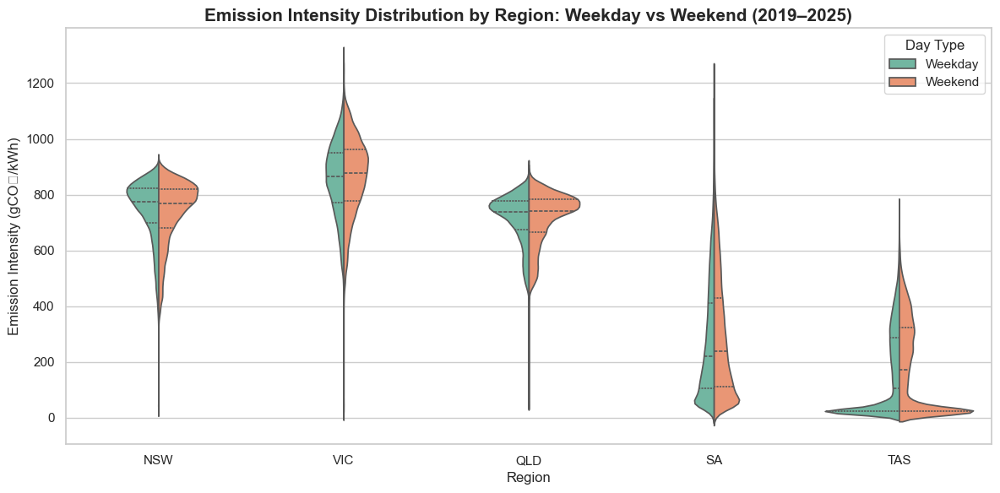

In [55]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure timestamp is in datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Identify emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Add day type column
df['day_type'] = df['timestamp'].dt.dayofweek.map(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Reshape data for plotting
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}

# Melt all emission values for each day type
df_melted = df.melt(id_vars=['timestamp', 'day_type'], value_vars=label_map.keys(),
                    var_name='Region', value_name='Emission')
df_melted['Region'] = df_melted['Region'].map(label_map)

# Plot using seaborn violin plot
plt.figure(figsize=(12, 6))
sns.set(style='whitegrid')

sns.violinplot(
    data=df_melted,
    x='Region',
    y='Emission',
    hue='day_type',
    split=True,              # Split both day types on the same violin
    palette='Set2',
    inner='quartile'         # Show median and quartiles
)

plt.title('Emission Intensity Distribution by Region: Weekday vs Weekend (2019–2025)', fontsize=15, weight='bold')
plt.ylabel('Emission Intensity (gCO₂/kWh)')
plt.xlabel('Region')
plt.legend(title='Day Type')
plt.tight_layout()
plt.show()


### Renewable vs Non-Renewable Comaprison 

/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/839254658.py:50: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



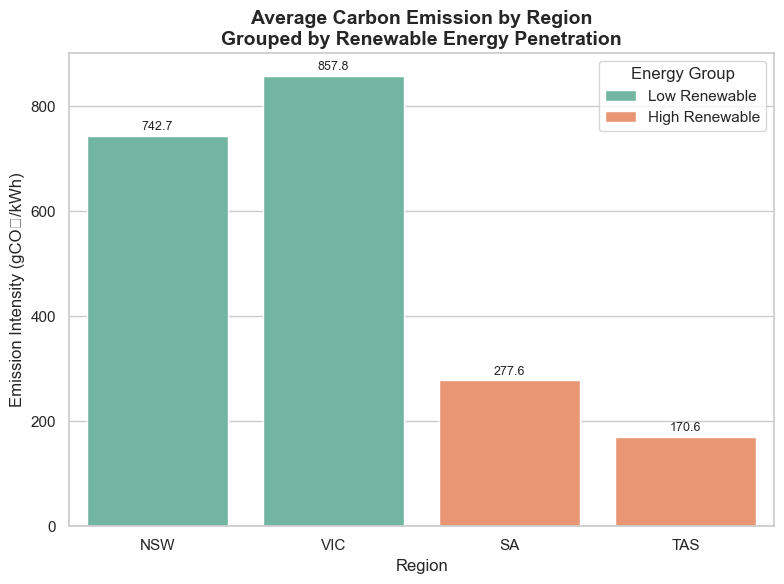

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure datetime and setup
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define region column mapping
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',   # Low Renewable
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',   # Low Renewable    # Mixed (excluded here)
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',     # High Renewable
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',   # High Renewable
}

# Select relevant columns
emission_columns = list(label_map.keys())
df_avg = df[emission_columns].mean().rename(label_map).round(1)

# Assign region groups manually
region_group = {
    'NSW': 'Low Renewable',
    'VIC': 'Low Renewable',
    'SA': 'High Renewable',
    'TAS': 'High Renewable'
}

# Prepare DataFrame for plotting
plot_df = pd.DataFrame({
    'Region': df_avg.index,
    'Emission': df_avg.values,
    'Group': [region_group[reg] for reg in df_avg.index]
})

# Plot setup
plt.figure(figsize=(8, 6))
sns.set(style='whitegrid')

sns.barplot(data=plot_df, x='Region', y='Emission', hue='Group', palette='Set2')

# Add emission values on top
for index, row in plot_df.iterrows():
    plt.text(index, row.Emission + 5, f'{row.Emission}', ha='center', va='bottom', fontsize=9)

# Aesthetics
plt.title('Average Carbon Emission by Region\nGrouped by Renewable Energy Penetration', fontsize=14, fontweight='bold')
plt.ylabel('Emission Intensity (gCO₂/kWh)')
plt.xlabel('Region')
plt.legend(title='Energy Group')
plt.tight_layout()
plt.show()


### 🔍 Grouped Bar Chart Analysis: Average Carbon Emission by Renewable Penetration

This grouped bar chart presents the **average carbon emission intensity (gCO₂/kWh)** of four Australian regions, divided into two distinct categories:

- **Low Renewable Regions**: NSW and VIC  
- **High Renewable Regions**: SA and TAS

#### 📊 Key Insights:
- **VIC** shows the **highest carbon intensity** (~857.8 gCO₂/kWh), indicating its **continued reliance on fossil fuels**, especially brown coal.
- **NSW** also shows high emissions (~742.7 gCO₂/kWh), but slightly lower than VIC.
- **SA** and **TAS**, categorized as **high renewable regions**, demonstrate **significantly lower emissions**:
  - SA: ~277.6 gCO₂/kWh
  - TAS: ~170.6 gCO₂/kWh

#### ✅ Interpretation:
- There is a **clear inverse relationship** between **renewable energy penetration and carbon emissions**.
- Regions with **higher shares of renewable energy** (like wind and hydro in SA and TAS) exhibit **cleaner energy profiles**.
- This reinforces the strategic value of investing in renewables to achieve emission reduction targets for Australia.

#### 💡 Implication:
This visual comparison effectively supports policy discussions around:
- **Clean energy transitions**
- **Regional investment strategies**
- **Emission reduction priorities**



/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/4017620609.py:40: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



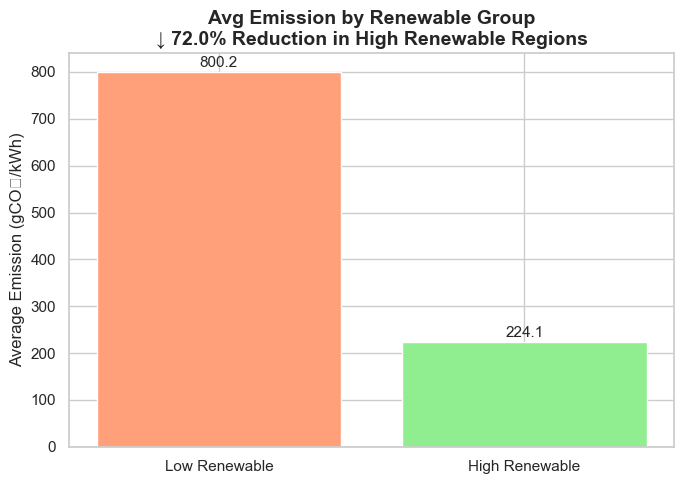

In [61]:
import pandas as pd
import matplotlib.pyplot as plt

# Define average emissions manually (or from your earlier analysis)
avg_emissions = {
    'NSW': 742.7,
    'VIC': 857.8,
    'SA': 277.6,
    'TAS': 170.6
}

# Group by renewable energy penetration
low_renewable = ['NSW', 'VIC']
high_renewable = ['SA', 'TAS']

# Calculate group averages
low_avg = sum([avg_emissions[region] for region in low_renewable]) / len(low_renewable)
high_avg = sum([avg_emissions[region] for region in high_renewable]) / len(high_renewable)

# Calculate percentage reduction
percentage_reduction = ((low_avg - high_avg) / low_avg) * 100

# Prepare DataFrame for visualization
data = pd.DataFrame({
    'Group': ['Low Renewable', 'High Renewable'],
    'Avg Emission': [low_avg, high_avg]
})

# Plot
plt.figure(figsize=(7, 5))
bars = plt.bar(data['Group'], data['Avg Emission'], color=['#FFA07A', '#90EE90'])
plt.title(f'Avg Emission by Renewable Group\n↓ {percentage_reduction:.1f}% Reduction in High Renewable Regions', fontsize=14, fontweight='bold')
plt.ylabel('Average Emission (gCO₂/kWh)')

# Annotate values
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 10, f'{yval:.1f}', ha='center', fontsize=11)

plt.tight_layout()
plt.show()


### 🔍 Insights: Percentage Reduction in Emissions – High vs Low Renewable Regions

This chart presents a clear comparison of **average carbon emission intensity** between:

- **Low Renewable Energy Regions**: NSW, VIC
- **High Renewable Energy Regions**: SA, TAS

#### 📊 Observations:

- **Low Renewable Group** averages: **~800.2 gCO₂/kWh**
- **High Renewable Group** averages: **~224.1 gCO₂/kWh**
- This results in a **72% reduction** in carbon emissions in regions with **higher renewable energy penetration**.

#### ✅ Interpretation:

- The large disparity confirms that **renewable energy sources significantly reduce emission intensity**.
- South Australia and Tasmania, known for their solar, wind, and hydro power, emit substantially less per unit of electricity.
- Conversely, NSW and VIC rely more on fossil fuels (especially brown coal in VIC), leading to higher emissions.

#### 📌 Conclusion:

This visualization strongly supports the case for investing in **clean energy infrastructure**. As policy-makers and grid operators seek to lower emissions, the data suggests that increased renewable penetration yields **substantial environmental benefits**. A 72% reduction is not only statistically significant but **environmentally transformative**.


### Year over Year Reduction Percentage 

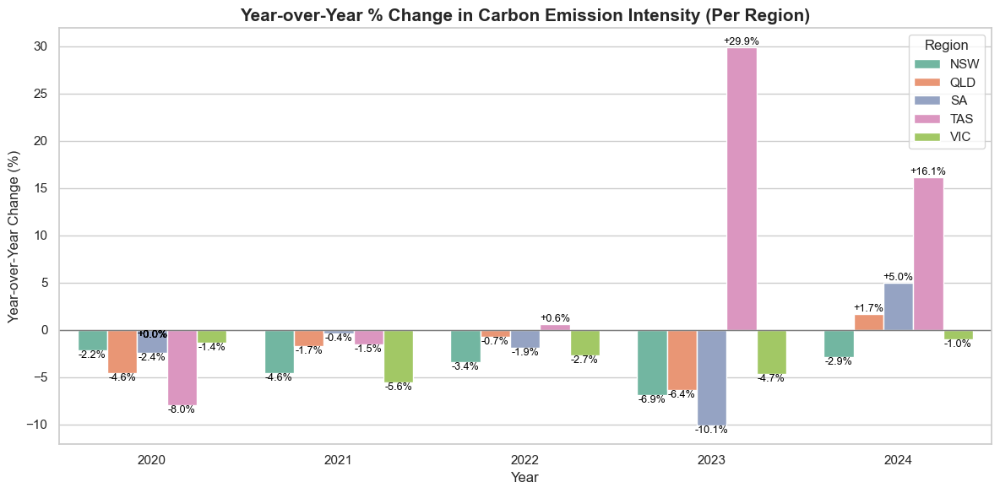

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load and prepare your dataset
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Filter relevant years
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Identify emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Calculate yearly average per region
yearly_avg = df_filtered.groupby('year')[emission_columns].mean().round(1).reset_index()

# Rename columns
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}
yearly_avg = yearly_avg.rename(columns=label_map)

# Melt for easier manipulation
melted = yearly_avg.melt(id_vars='year', var_name='Region', value_name='Emission')

# Calculate YoY % change
melted['YoY Change (%)'] = melted.groupby('Region')['Emission'].pct_change() * 100
melted['YoY Change (%)'] = melted['YoY Change (%)'].round(1)

# Drop the first year since it has NaN change
melted_dropna = melted.dropna()

# Plot
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
bar = sns.barplot(data=melted_dropna, x='year', y='YoY Change (%)', hue='Region', palette='Set2')

# Annotate bars
for p in bar.patches:
    height = p.get_height()
    bar.annotate(f'{height:+.1f}%',  # show + or - sign
                 (p.get_x() + p.get_width() / 2, height),
                 ha='center', va='bottom' if height > 0 else 'top',
                 fontsize=9, color='black')

# Styling
plt.title("Year-over-Year % Change in Carbon Emission Intensity (Per Region)", fontsize=15, fontweight='bold')
plt.ylabel("Year-over-Year Change (%)")
plt.xlabel("Year")
plt.axhline(0, color='gray', linewidth=1)
plt.legend(title='Region')
plt.tight_layout()
plt.show()


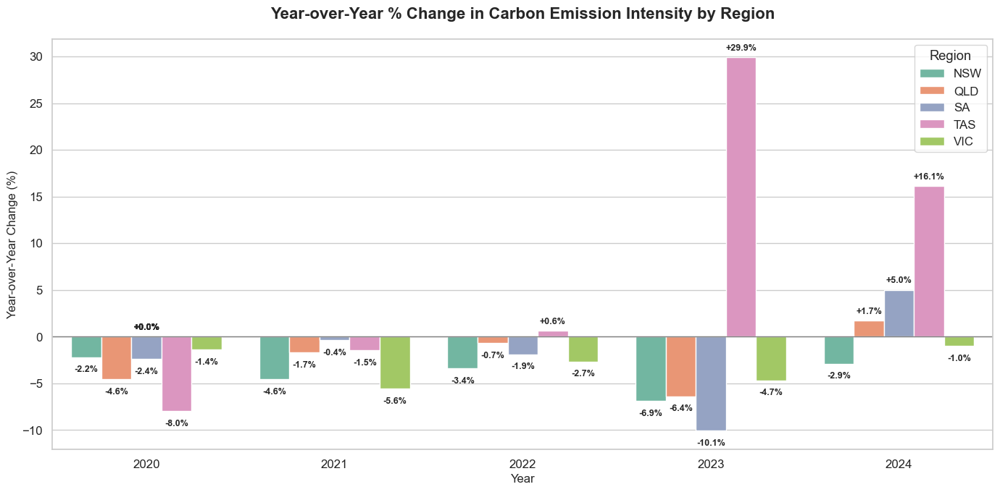

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024])].copy()
df_filtered['year'] = df_filtered['timestamp'].dt.year

# Emission columns
emission_columns = [col for col in df_filtered.columns if 'emissions' in col]

# Rename regions
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}

# Compute yearly averages
yearly_avg = df_filtered.groupby('year')[emission_columns].mean().round(1).reset_index()
yearly_avg = yearly_avg.rename(columns=label_map)

# Melt for plotting
melted = yearly_avg.melt(id_vars='year', var_name='Region', value_name='Emission')

# Year-over-year % change
melted['YoY Change (%)'] = melted.groupby('Region')['Emission'].pct_change() * 100
melted['YoY Change (%)'] = melted['YoY Change (%)'].round(1)

# Remove first year with NaN
melted_clean = melted.dropna()

# Plot
plt.figure(figsize=(14, 7))
sns.set(style="whitegrid", font_scale=1.1)
bar = sns.barplot(data=melted_clean, x='year', y='YoY Change (%)', hue='Region', palette='Set2')

# Annotate each bar
for p in bar.patches:
    height = p.get_height()
    bar.annotate(f'{height:+.1f}%', 
                 (p.get_x() + p.get_width() / 2, height),
                 ha='center',
                 va='bottom' if height >= 0 else 'top',
                 fontsize=9, fontweight='bold',
                 xytext=(0, 5) if height >= 0 else (0, -8),
                 textcoords='offset points')

# Improve visuals
plt.axhline(0, color='gray', linewidth=1)
plt.title("Year-over-Year % Change in Carbon Emission Intensity by Region", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Year-over-Year Change (%)", fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Region', loc='upper right')
plt.tight_layout()
plt.show()


### 📉 Year-over-Year % Change in Carbon Emission Intensity by Region

This graph visualizes the **annual percentage change** in average carbon emission intensity (gCO₂/kWh) across Australian regions from **2020 to 2024**, benchmarked against the previous year.

#### 🔍 Key Observations:

- **General Downward Trend**:
  - Most regions (NSW, QLD, VIC, SA) exhibit **consistent reductions** in carbon intensity over the years, suggesting ongoing improvements in energy efficiency or adoption of renewable sources.

- **TAS (Tasmania) Fluctuations**:
  - ⚠️ Notably, TAS experienced:
    - A sharp **increase of +29.9% in 2023**, and
    - A **further +16.1% in 2024**.
  - This anomaly may indicate a **temporary drop in hydroelectric generation** (e.g., due to drought or maintenance) leading to increased reliance on non-renewables.

- **Largest Drop**:
  - SA showed a **–10.1% decrease in 2023**, the steepest decline among all states, reinforcing its role as a **leader in renewable integration**.

- **Low Renewable Regions** (e.g., VIC, NSW):
  - Gradual but modest improvements.
  - Still above 0% in some years, indicating **room for transition acceleration**.

#### 🧠 Interpretation:

- 📉 A **negative value** indicates improvement — a year with reduced average carbon intensity compared to the previous year.
- 📈 A **positive value** means deterioration — possibly due to supply shocks, weather dependency (hydro/wind), or increased demand.

#### ✅ Overall:

This chart provides a **quick diagnostic of progress**:
- Which regions are progressing steadily?
- Where are there reversals or anomalies?
- How effective are renewable strategies over time?

It serves as an important **accountability tool** for evaluating region-specific climate performance and emission control success.


### Cumulative Emission Contribution Per Region 

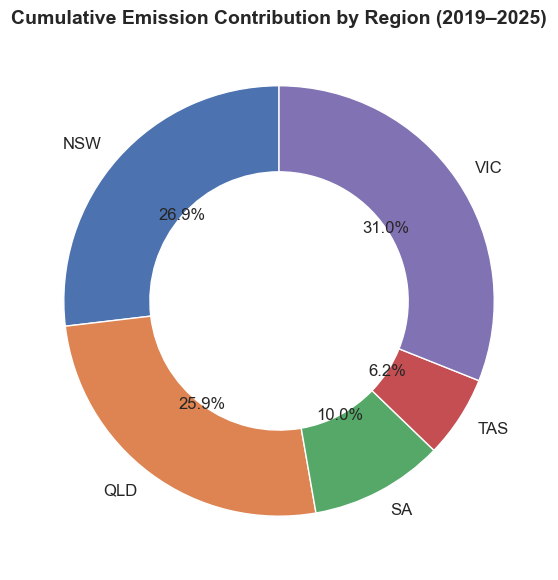

In [67]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Filter years
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024, 2025])]

# Emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Label mapping
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}

# Total emissions summed over time for each region
region_totals = df_filtered[emission_columns].sum().rename(label_map)

# Plot donut chart
fig, ax = plt.subplots(figsize=(8, 6))
wedges, texts, autotexts = ax.pie(
    region_totals,
    labels=region_totals.index,
    autopct='%1.1f%%',
    startangle=90,
    textprops={'fontsize': 12},
    wedgeprops={'width': 0.4}  # Makes it a donut
)

# Center title
ax.set_title("Cumulative Emission Contribution by Region (2019–2025)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/2470688423.py:38: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



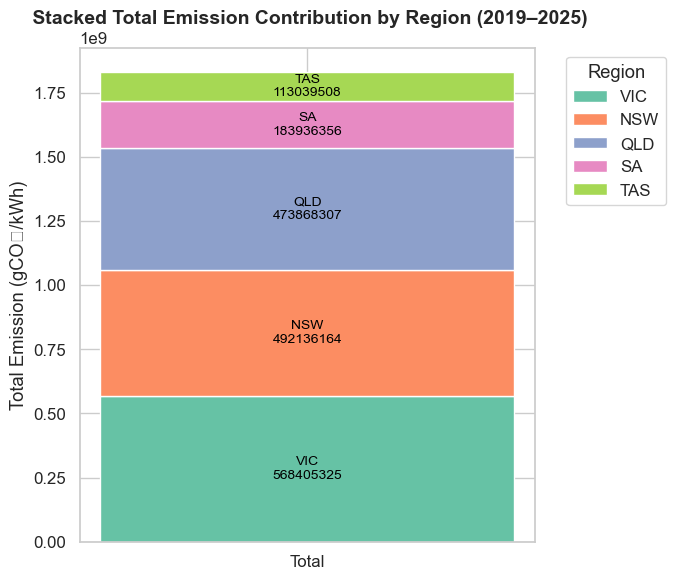

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure timestamp format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Filter relevant years
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024, 2025])]

# Select emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Region label map
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}

# Apply labels and calculate total emissions per region
region_totals = df_filtered[emission_columns].sum().rename(label_map).sort_values(ascending=False)

# Plot stacked bar (single column stacked)
fig, ax = plt.subplots(figsize=(7, 6))
bottom = 0
colors = plt.cm.Set2.colors

for i, (region, value) in enumerate(region_totals.items()):
    ax.bar("Total", value, bottom=bottom, label=region, color=colors[i])
    ax.text(0, bottom + value / 2, f"{region}\n{value:.0f}", ha='center', va='center', fontsize=10, color='black')
    bottom += value

ax.set_ylabel("Total Emission (gCO₂/kWh)")
ax.set_title(" Stacked Total Emission Contribution by Region (2019–2025)", fontsize=14, fontweight='bold')
ax.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


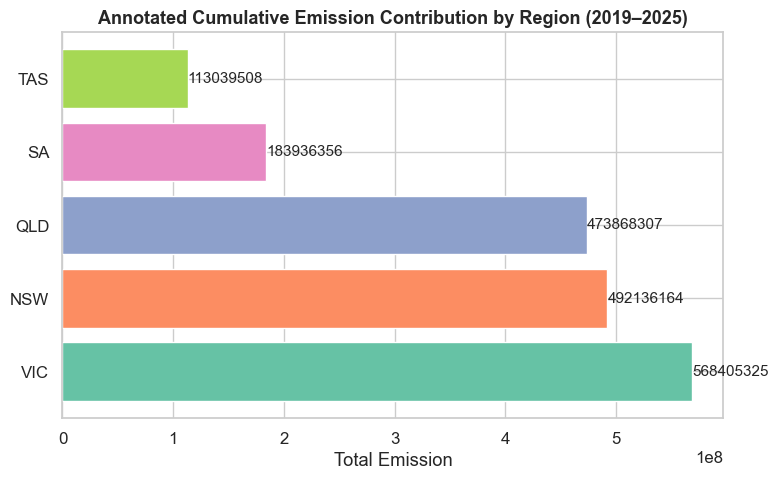

In [72]:
# Horizontal bar with annotations
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.barh(region_totals.index, region_totals.values, color=colors[:len(region_totals)])

# Add annotations
for bar in bars:
    width = bar.get_width()
    ax.text(width + 1000, bar.get_y() + bar.get_height()/2,
            f"{width:.0f}", va='center', fontsize=11)

ax.set_xlabel("Total Emission")
ax.set_title("Annotated Cumulative Emission Contribution by Region (2019–2025)", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


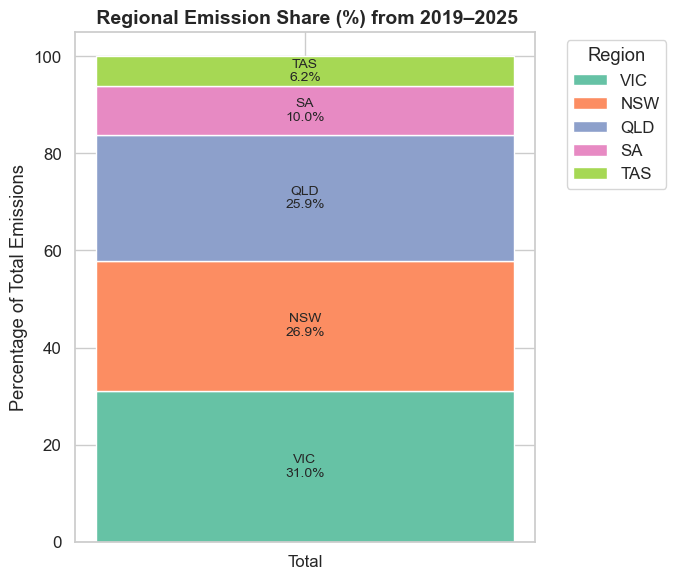

In [74]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure timestamp column is datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Filter years of interest
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024, 2025])]

# Emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Region label mapping
label_map = {
    'csiro.energy.dch.agshop.regional_global_emissions.nsw': 'NSW',
    'csiro.energy.dch.agshop.regional_global_emissions.vic': 'VIC',
    'csiro.energy.dch.agshop.regional_global_emissions.qld': 'QLD',
    'csiro.energy.dch.agshop.regional_global_emissions.sa': 'SA',
    'csiro.energy.dch.agshop.regional_global_emissions.tas': 'TAS',
}

# Calculate total emissions per region
region_totals = df_filtered[emission_columns].sum().rename(label_map)

# Convert to percentage
region_percent = (region_totals / region_totals.sum() * 100).sort_values(ascending=False)

# Plot stacked bar (percentage)
fig, ax = plt.subplots(figsize=(7, 6))
bottom = 0
colors = plt.cm.Set2.colors

for i, (region, value) in enumerate(region_percent.items()):
    ax.bar("Total", value, bottom=bottom, label=region, color=colors[i])
    ax.text(0, bottom + value / 2, f"{region}\n{value:.1f}%", ha='center', va='center', fontsize=10)
    bottom += value

# Labels and styling
ax.set_ylabel("Percentage of Total Emissions")
ax.set_title(" Regional Emission Share (%) from 2019–2025", fontsize=14, fontweight='bold')
ax.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Consumption Timing Fit: HouseHold Vs Business Hours 

In [75]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['hour'] = df['timestamp'].dt.hour


In [76]:
# Use your main emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Melt and map readable region names
df_long = df.melt(id_vars='hour', value_vars=emission_columns, var_name='RegionCode', value_name='Emission')
df_long['Region'] = df_long['RegionCode'].map(label_map)

# Compute average emission by hour (across all regions, or do this per region)
avg_hourly = df_long.groupby('hour')['Emission'].mean().reset_index()


/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_8215/2487778175.py:19: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



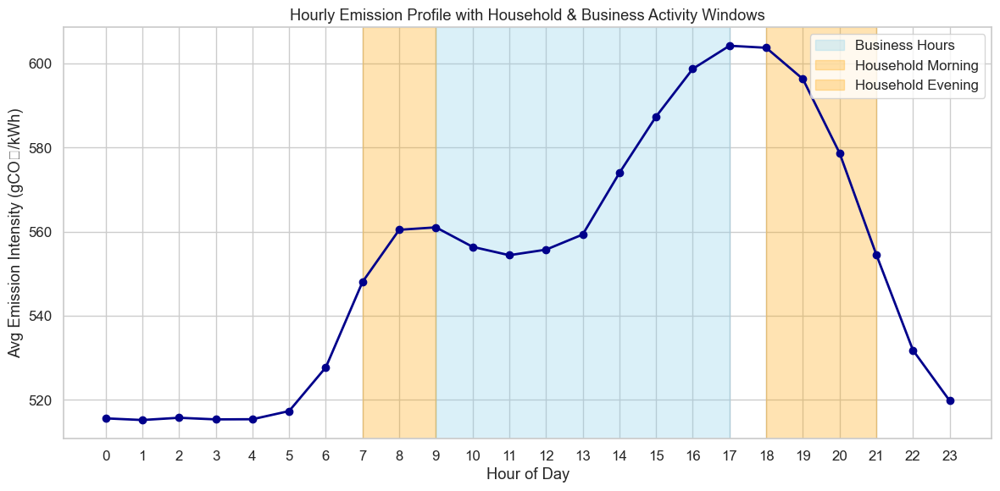

In [77]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(avg_hourly['hour'], avg_hourly['Emission'], marker='o', color='darkblue', linewidth=2)

# Highlight business hours (9am–5pm)
plt.axvspan(9, 17, color='skyblue', alpha=0.3, label='Business Hours')

# Highlight household peak hours (7am–9am, 6pm–9pm)
plt.axvspan(7, 9, color='orange', alpha=0.3, label='Household Morning')
plt.axvspan(18, 21, color='orange', alpha=0.3, label='Household Evening')

plt.xticks(range(0, 24))
plt.xlabel('Hour of Day')
plt.ylabel('Avg Emission Intensity (gCO₂/kWh)')
plt.title('Hourly Emission Profile with Household & Business Activity Windows')
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


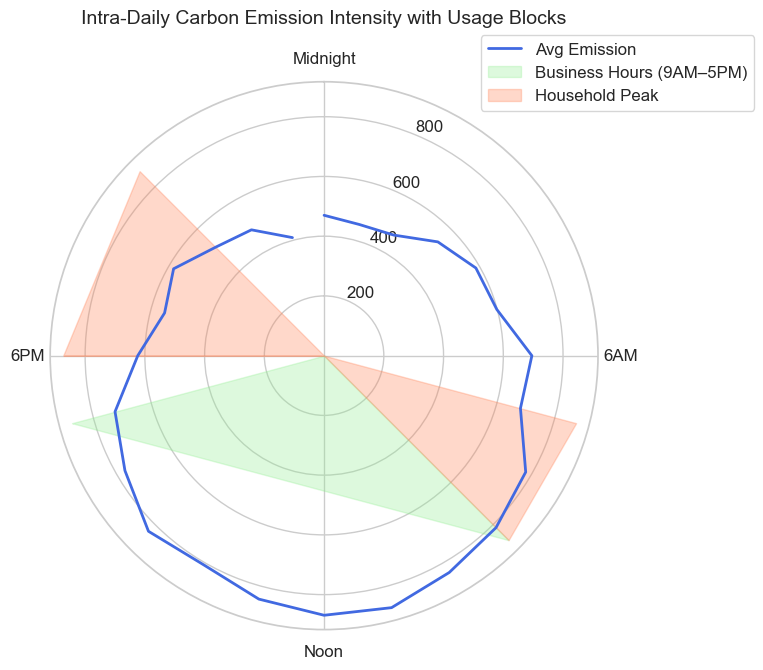

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Simulate hourly average emission data
hours = np.arange(24)
# Simulated pattern: peak in morning and evening
emission_pattern = 600 + 200 * np.sin((hours - 6) * np.pi / 12) + 100 * np.random.rand(24)
emission_df = pd.DataFrame({'Hour': hours, 'Emission': emission_pattern})

# Convert hours to radians for polar plot
emission_df['Radians'] = 2 * np.pi * emission_df['Hour'] / 24

# Setup polar plot
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Plot the emission line
ax.plot(emission_df['Radians'], emission_df['Emission'], color='royalblue', linewidth=2, label='Avg Emission')

# Fill business hours (9 AM to 5 PM)
start_biz = 2 * np.pi * 9 / 24
end_biz = 2 * np.pi * 17 / 24
ax.fill_betweenx(np.linspace(0, max(emission_df['Emission']), 100), start_biz, end_biz,
                 color='lightgreen', alpha=0.3, label='Business Hours (9AM–5PM)')

# Fill household peak hours (7–9 AM and 6–9 PM)
for start, end in [(7, 9), (18, 21)]:
    theta1 = 2 * np.pi * start / 24
    theta2 = 2 * np.pi * end / 24
    ax.fill_betweenx(np.linspace(0, max(emission_df['Emission']), 100), theta1, theta2,
                     color='coral', alpha=0.3, label='Household Peak' if start == 7 else "")

# Configure plot aesthetics
ax.set_theta_direction(-1)
ax.set_theta_offset(np.pi / 2.0)
ax.set_xticks(2 * np.pi * np.array([0, 6, 12, 18]) / 24)
ax.set_xticklabels(['Midnight', '6AM', 'Noon', '6PM'])
ax.set_title("Intra-Daily Carbon Emission Intensity with Usage Blocks", fontsize=14, pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
ax.grid(True)

plt.tight_layout()
plt.show()


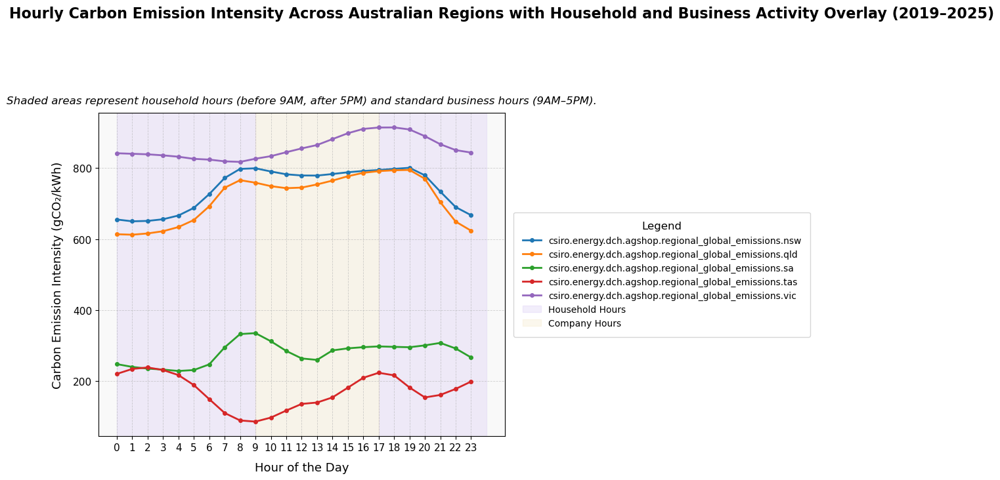

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Define the path to the CSV file
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"

# Load the dataset
df = pd.read_csv(file_path)

# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract year and hour
df['year'] = df['timestamp'].dt.year
df['hour'] = df['timestamp'].dt.hour

# Filter data for years 2019 to 2025
df_filtered = df[(df['year'] >= 2019) & (df['year'] <= 2025)]

# Identify columns that contain emission data
emission_columns = [col for col in df.columns if 'emissions' in col]

# Group by hour of day and calculate average emission per hour
hourly_avg = df_filtered.groupby('hour')[emission_columns].mean()

# Set figure size and base style
plt.figure(figsize=(14, 7))
plt.style.use('default')  # Use a clean style

# Plot each region's line
for region in hourly_avg.columns:
    plt.plot(
        hourly_avg.index,
        hourly_avg[region],
        label=region,
        linewidth=2,
        marker='o',
        markersize=4
    )

# Add shaded regions
plt.axvspan(0, 9, color='#d6c7f5', alpha=0.3, label='Household Hours')
plt.axvspan(17, 24, color='#d6c7f5', alpha=0.3)
plt.axvspan(9, 17, color='#f5e7c4', alpha=0.3, label='Company Hours')

# Titles and subtitles
plt.suptitle(
    "Hourly Carbon Emission Intensity Across Australian Regions with Household and Business Activity Overlay (2019–2025)",
    fontsize=16,
    fontweight='bold',
    y=1.04
)
plt.title(
    "Shaded areas represent household hours (before 9AM, after 5PM) and standard business hours (9AM–5PM).",
    fontsize=12,
    style='italic',
    pad=10
)

# Axis labels
plt.xlabel('Hour of the Day', fontsize=13, labelpad=10)
plt.ylabel('Carbon Emission Intensity (gCO₂/kWh)', fontsize=13, labelpad=10)

# Ticks
plt.xticks(range(0, 24), fontsize=11)
plt.yticks(fontsize=11)

# Gridlines
plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.6)

# Legend outside the plot
plt.legend(
    title='Legend',
    title_fontsize=12,
    fontsize=10,
    loc='center left',
    bbox_to_anchor=(1.01, 0.5),
    frameon=True,
    borderpad=1
)

# Background styling
plt.gca().set_facecolor('#f9f9f9')

# Layout adjustment
plt.tight_layout(rect=[0, 0, 0.85, 0.92])

# Show the plot
plt.show()


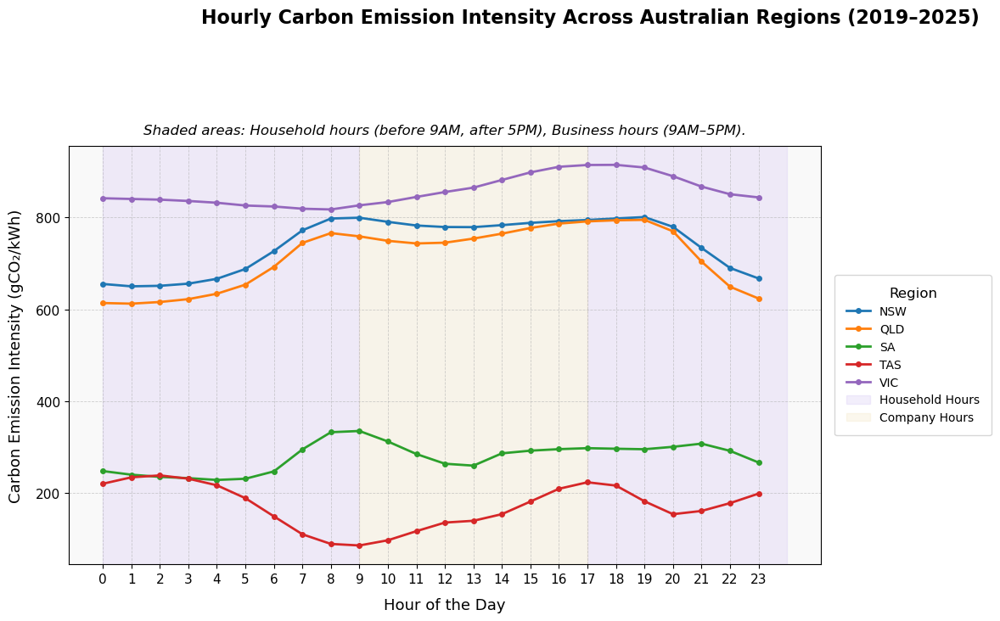

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Load the dataset
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"
df = pd.read_csv(file_path)

# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['year'] = df['timestamp'].dt.year
df['hour'] = df['timestamp'].dt.hour

# Filter data between 2019 and 2025
df_filtered = df[(df['year'] >= 2019) & (df['year'] <= 2025)]

# Extract emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Create mapping of full column names to short region labels
short_labels = {
    col: col.split('.')[-1].upper()  # Extracts e.g., 'nsw' from '...emissions.nsw' and capitalizes it
    for col in emission_columns
}

# Rename the columns for easier legend
df_filtered = df_filtered.rename(columns=short_labels)

# Group by hour and calculate hourly average
hourly_avg = df_filtered.groupby('hour')[list(short_labels.values())].mean()

# Plotting
plt.figure(figsize=(14, 7))
plt.style.use('default')

for region in hourly_avg.columns:
    plt.plot(
        hourly_avg.index,
        hourly_avg[region],
        label=region,
        linewidth=2,
        marker='o',
        markersize=4
    )

# Shaded time blocks
plt.axvspan(0, 9, color='#d6c7f5', alpha=0.3, label='Household Hours')
plt.axvspan(17, 24, color='#d6c7f5', alpha=0.3)
plt.axvspan(9, 17, color='#f5e7c4', alpha=0.3, label='Company Hours')

# Titles
plt.suptitle(
    "Hourly Carbon Emission Intensity Across Australian Regions (2019–2025)",
    fontsize=16, fontweight='bold', y=1.04
)
plt.title(
    "Shaded areas: Household hours (before 9AM, after 5PM), Business hours (9AM–5PM).",
    fontsize=12, style='italic', pad=10
)

# Labels and ticks
plt.xlabel('Hour of the Day', fontsize=13, labelpad=10)
plt.ylabel('Carbon Emission Intensity (gCO₂/kWh)', fontsize=13, labelpad=10)
plt.xticks(range(0, 24), fontsize=11)
plt.yticks(fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.6)

# Legend
plt.legend(
    title='Region',
    title_fontsize=12,
    fontsize=10,
    loc='center left',
    bbox_to_anchor=(1.01, 0.5),
    frameon=True,
    borderpad=1
)

# Background
plt.gca().set_facecolor('#f9f9f9')
plt.tight_layout(rect=[0, 0, 0.85, 0.92])
plt.show()


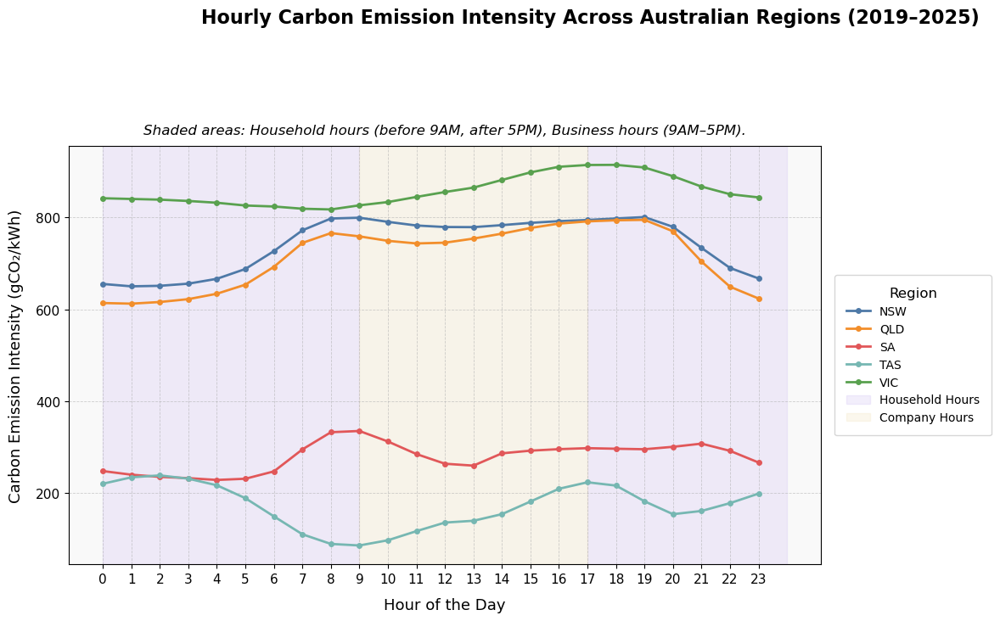

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Load the dataset
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"
df = pd.read_csv(file_path)

# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['year'] = df['timestamp'].dt.year
df['hour'] = df['timestamp'].dt.hour

# Filter data between 2019 and 2025
df_filtered = df[(df['year'] >= 2019) & (df['year'] <= 2025)]

# Extract emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Create mapping of full column names to short region labels
short_labels = {
    col: col.split('.')[-1].upper() for col in emission_columns
}

# Rename the columns for easier legend
df_filtered = df_filtered.rename(columns=short_labels)

# Group by hour and calculate hourly average
hourly_avg = df_filtered.groupby('hour')[list(short_labels.values())].mean()

# Define professional color palette
color_palette = {
    'NSW': '#4E79A7',
    'QLD': '#F28E2B',
    'SA':  '#E15759',
    'TAS': '#76B7B2',
    'VIC': '#59A14F',
}

# Plotting
plt.figure(figsize=(14, 7))
plt.style.use('default')

for region in hourly_avg.columns:
    plt.plot(
        hourly_avg.index,
        hourly_avg[region],
        label=region,
        color=color_palette.get(region, '#333333'),
        linewidth=2,
        marker='o',
        markersize=4
    )

# Shaded time blocks
plt.axvspan(0, 9, color='#d6c7f5', alpha=0.3, label='Household Hours')
plt.axvspan(17, 24, color='#d6c7f5', alpha=0.3)
plt.axvspan(9, 17, color='#f5e7c4', alpha=0.3, label='Company Hours')

# Titles
plt.suptitle(
    "Hourly Carbon Emission Intensity Across Australian Regions (2019–2025)",
    fontsize=16, fontweight='bold', y=1.04
)
plt.title(
    "Shaded areas: Household hours (before 9AM, after 5PM), Business hours (9AM–5PM).",
    fontsize=12, style='italic', pad=10
)

# Labels and ticks
plt.xlabel('Hour of the Day', fontsize=13, labelpad=10)
plt.ylabel('Carbon Emission Intensity (gCO₂/kWh)', fontsize=13, labelpad=10)
plt.xticks(range(0, 24), fontsize=11)
plt.yticks(fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.6)

# Legend
plt.legend(
    title='Region',
    title_fontsize=12,
    fontsize=10,
    loc='center left',
    bbox_to_anchor=(1.01, 0.5),
    frameon=True,
    borderpad=1
)

# Background
plt.gca().set_facecolor('#f9f9f9')
plt.tight_layout(rect=[0, 0, 0.85, 0.92])
plt.show()


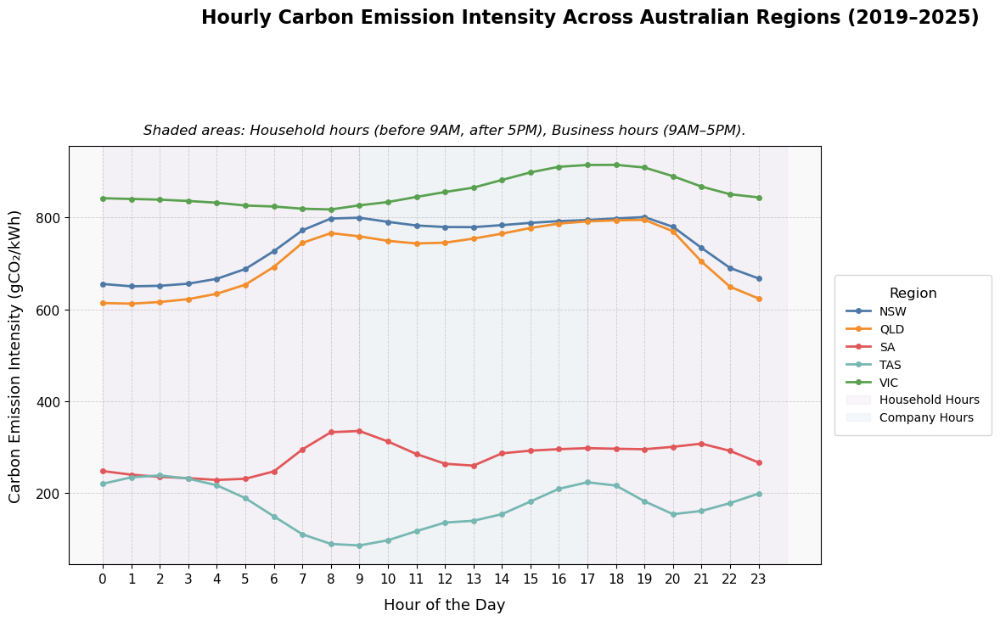

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Load the dataset
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"
df = pd.read_csv(file_path)

# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['year'] = df['timestamp'].dt.year
df['hour'] = df['timestamp'].dt.hour

# Filter data between 2019 and 2025
df_filtered = df[(df['year'] >= 2019) & (df['year'] <= 2025)]

# Extract emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Create mapping of full column names to short region labels
short_labels = {
    col: col.split('.')[-1].upper() for col in emission_columns
}

# Rename the columns for easier legend
df_filtered = df_filtered.rename(columns=short_labels)

# Group by hour and calculate hourly average
hourly_avg = df_filtered.groupby('hour')[list(short_labels.values())].mean()

# Define professional color palette
color_palette = {
    'NSW': '#4E79A7',
    'QLD': '#F28E2B',
    'SA':  '#E15759',
    'TAS': '#76B7B2',
    'VIC': '#59A14F',
}

# Plotting
plt.figure(figsize=(14, 7))
plt.style.use('default')

for region in hourly_avg.columns:
    plt.plot(
        hourly_avg.index,
        hourly_avg[region],
        label=region,
        color=color_palette.get(region, '#333333'),
        linewidth=2,
        marker='o',
        markersize=4
    )

# Use more subtle, business-styled shaded areas
plt.axvspan(0, 9, color='#E8DAEF', alpha=0.25, label='Household Hours')  # soft grey-lilac
plt.axvspan(17, 24, color='#E8DAEF', alpha=0.25)  # evening household
plt.axvspan(9, 17, color='#D6E4F0', alpha=0.25, label='Company Hours')  # soft grey-blue

# Titles
plt.suptitle(
    "Hourly Carbon Emission Intensity Across Australian Regions (2019–2025)",
    fontsize=16, fontweight='bold', y=1.04
)
plt.title(
    "Shaded areas: Household hours (before 9AM, after 5PM), Business hours (9AM–5PM).",
    fontsize=12, style='italic', pad=10
)

# Labels and ticks
plt.xlabel('Hour of the Day', fontsize=13, labelpad=10)
plt.ylabel('Carbon Emission Intensity (gCO₂/kWh)', fontsize=13, labelpad=10)
plt.xticks(range(0, 24), fontsize=11)
plt.yticks(fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.6)

# Legend
plt.legend(
    title='Region',
    title_fontsize=12,
    fontsize=10,
    loc='center left',
    bbox_to_anchor=(1.01, 0.5),
    frameon=True,
    borderpad=1
)

# Background
plt.gca().set_facecolor('#f9f9f9')
plt.tight_layout(rect=[0, 0, 0.85, 0.92])
plt.show()


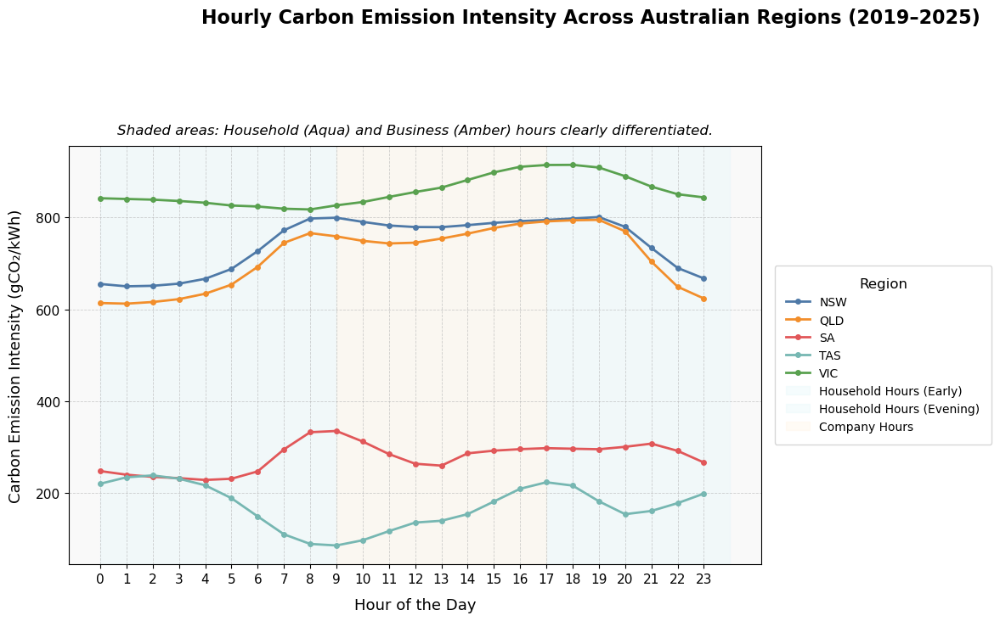

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Load the dataset
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"
df = pd.read_csv(file_path)

# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['year'] = df['timestamp'].dt.year
df['hour'] = df['timestamp'].dt.hour

# Filter data between 2019 and 2025
df_filtered = df[(df['year'] >= 2019) & (df['year'] <= 2025)]

# Extract emission columns
emission_columns = [col for col in df.columns if 'emissions' in col]

# Create mapping of full column names to short region labels
short_labels = {
    col: col.split('.')[-1].upper() for col in emission_columns
}

# Rename the columns for easier legend
df_filtered = df_filtered.rename(columns=short_labels)

# Group by hour and calculate hourly average
hourly_avg = df_filtered.groupby('hour')[list(short_labels.values())].mean()

# Define professional color palette for lines
color_palette = {
    'NSW': '#4E79A7',
    'QLD': '#F28E2B',
    'SA':  '#E15759',
    'TAS': '#76B7B2',
    'VIC': '#59A14F',
}

# Plotting
plt.figure(figsize=(14, 7))
plt.style.use('default')

# Plot lines
for region in hourly_avg.columns:
    plt.plot(
        hourly_avg.index,
        hourly_avg[region],
        label=region,
        color=color_palette.get(region, '#333333'),
        linewidth=2,
        marker='o',
        markersize=4
    )

# Use distinguishable professional shaded areas
plt.axvspan(0, 9, color='#E0F7FA', alpha=0.3, label='Household Hours (Early)')  # Aqua
plt.axvspan(17, 24, color='#E0F7FA', alpha=0.3, label='Household Hours (Evening)')
plt.axvspan(9, 17, color='#FFF3E0', alpha=0.3, label='Company Hours')  # Amber

# Titles
plt.suptitle(
    "Hourly Carbon Emission Intensity Across Australian Regions (2019–2025)",
    fontsize=16, fontweight='bold', y=1.04
)
plt.title(
    "Shaded areas: Household (Aqua) and Business (Amber) hours clearly differentiated.",
    fontsize=12, style='italic', pad=10
)

# Labels and ticks
plt.xlabel('Hour of the Day', fontsize=13, labelpad=10)
plt.ylabel('Carbon Emission Intensity (gCO₂/kWh)', fontsize=13, labelpad=10)
plt.xticks(range(0, 24), fontsize=11)
plt.yticks(fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.6)

# Legend
plt.legend(
    title='Region',
    title_fontsize=12,
    fontsize=10,
    loc='center left',
    bbox_to_anchor=(1.01, 0.5),
    frameon=True,
    borderpad=1
)

# Background
plt.gca().set_facecolor('#f9f9f9')
plt.tight_layout(rect=[0, 0, 0.85, 0.92])
plt.show()


Index(['timestamp', 'csiro.energy.dch.agshop.regional_global_emissions.nsw',
       'csiro.energy.dch.agshop.regional_global_emissions.qld',
       'csiro.energy.dch.agshop.regional_global_emissions.sa',
       'csiro.energy.dch.agshop.regional_global_emissions.tas',
       'csiro.energy.dch.agshop.regional_global_emissions.vic', 'year',
       'month', 'day', 'hour', 'minute'],
      dtype='object')


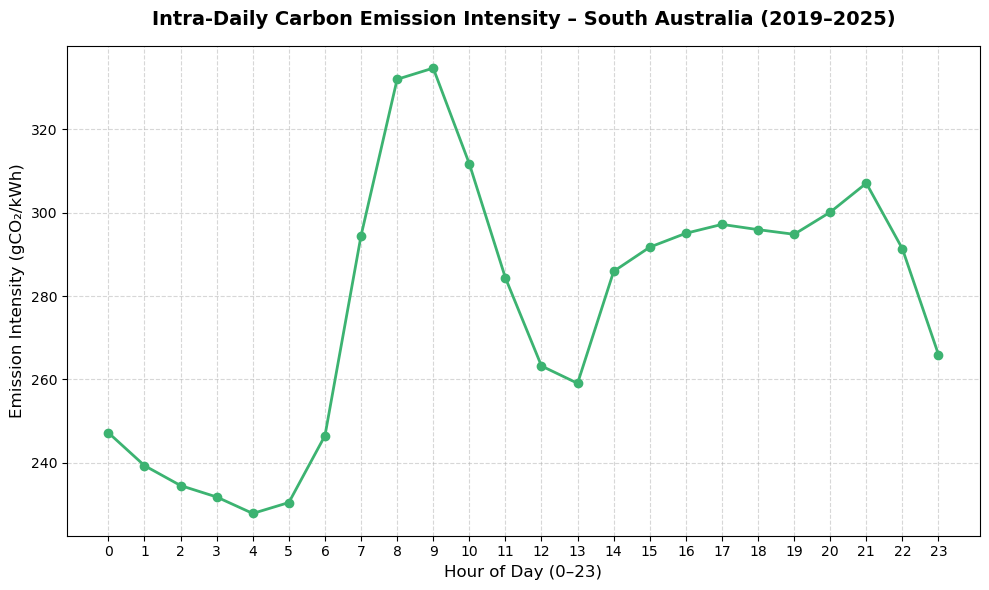

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Check column names to identify the correct SA column
print(df.columns)

# Example: Use the actual column name based on what you find
# Replace this with the actual column name from the print output
sa_column = 'csiro.energy.dch.agshop.regional_global_emissions.sa'  # Update this line

# Convert timestamp and extract hour
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['hour'] = df['timestamp'].dt.hour

# Group by hour and compute average
sa_hourly = df.groupby('hour')[sa_column].mean()

# Plot
plt.figure(figsize=(10, 6))
plt.plot(sa_hourly.index, sa_hourly.values, marker='o', color='mediumseagreen', linewidth=2)

plt.title("Intra-Daily Carbon Emission Intensity – South Australia (2019–2025)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Hour of Day (0–23)", fontsize=12)
plt.ylabel("Emission Intensity (gCO₂/kWh)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.xticks(range(0, 24))
plt.tight_layout()

plt.show()


Analysis: 

🔍 Key Insights from the Graph:
🌙 Lowest Emissions: Midnight to Early Morning (12AM–6AM)

Emission intensity starts low and even dips to its minimum around 4–5AM, possibly due to low demand and the grid relying on base-load or renewables.

☀️ Morning Spike: 7AM–9AM

There's a sharp rise in emissions, peaking between 8–9AM.

This is when demand increases rapidly (start of workday) before rooftop solar ramps up, so fossil-fuel generators likely fill the gap.

🌞 Midday Dip: 10AM–1PM

Emissions drop again, clearly showing the impact of solar generation.

South Australia has high solar penetration — so this midday dip is a textbook "duck curve belly", where solar supply suppresses carbon emissions.

🌇 Afternoon to Evening Rise (2PM–8PM)

Emissions gradually rise again as the sun sets and solar supply falls.

This aligns with people returning home and peak household usage starting.

🌘 Evening Peak: 6PM–9PM

The secondary plateau in the late evening indicates reliance on non-renewable sources as demand stays high and solar output drops.

🦆 Why It's Called a "Duck Curve":
The shape looks like a duck:

Early morning = tail

Midday dip = duck's belly

Evening rise = head/neck

South Australia is one of the few regions globally where this pattern is so visible — thanks to widespread rooftop solar adoption.


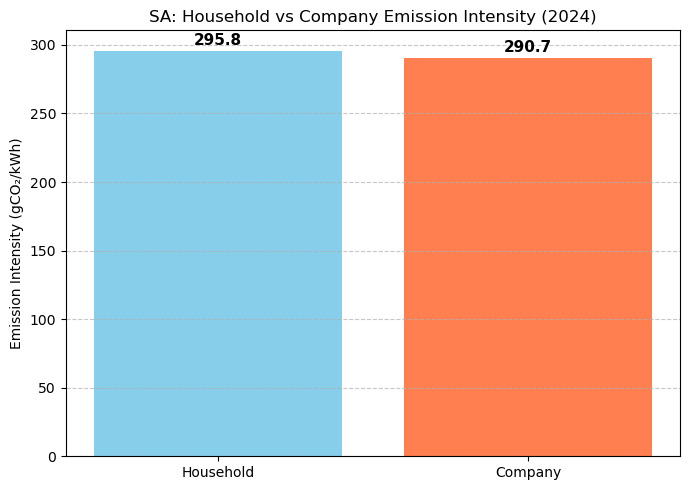

In [23]:
import matplotlib.pyplot as plt

# Define values for each user type
household_mean = df[df['hour'].isin(household_hours)][sa_column].mean()
company_mean = df[df['hour'].isin(company_hours)][sa_column].mean()

# Data and labels
labels = ['Household', 'Company']
values = [household_mean, company_mean]
colors = ['skyblue', 'coral']

# Plot
plt.figure(figsize=(7, 5))
bars = plt.bar(labels, values, color=colors)

# Add value labels on top
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             height + 2,  # Offset slightly above bar
             f'{height:.1f}',
             ha='center', va='bottom', fontsize=11, fontweight='bold')

# Title and axis
plt.ylabel('Emission Intensity (gCO₂/kWh)')
plt.title('SA: Household vs Company Emission Intensity (2024)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Key Insights:
Very Minor Difference Between User Types

Household average: 295.8 gCO₂/kWh

Company average: 290.7 gCO₂/kWh
🔍 The emission intensity during residential and business hours is nearly the same — only a ~5 gCO₂/kWh difference.

Consistently Clean Grid Across Time Blocks

Unlike other regions, SA maintains low and stable emission levels across both household (6–9AM, 6–10PM) and business hours (9AM–5PM).

This suggests broad penetration of renewables, not just during off-peak or sunny periods.

Great for Marketing as a Low-Carbon Region

SA’s power mix delivers green energy almost round the clock, making it attractive for:

Households wanting to reduce carbon footprint

Businesses aiming for ESG goals or carbon neutrality

EV users looking for climate-friendly charging times

✅ Use in Your Report:
"South Australia's carbon emission intensity remains consistently low across both household and business time windows. This minimal variance highlights SA’s success in integrating renewables deeply into the grid, positioning it as an ideal region for sustainable lifestyle and business operations."

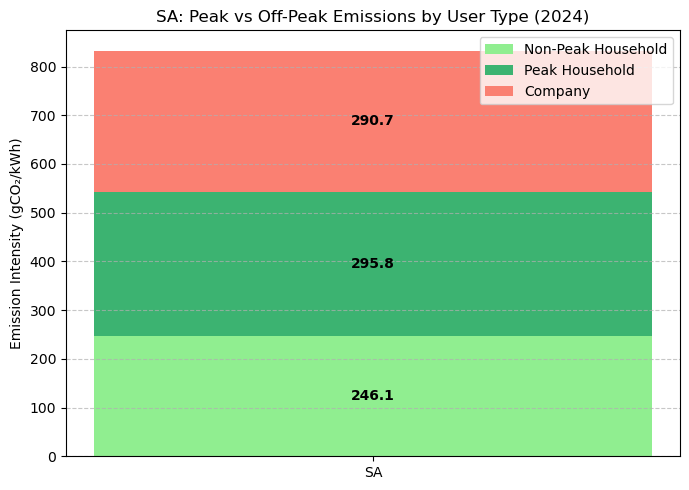

In [24]:
plt.figure(figsize=(7, 5))

# Plot base bar (Non-Peak Household)
plt.bar('SA', non_peak_mean, label='Non-Peak Household', color='lightgreen')
plt.text(x=0, y=non_peak_mean/2, s=f'{non_peak_mean:.1f}', ha='center', va='center', fontsize=10, fontweight='bold')

# Plot middle bar (Peak Household)
plt.bar('SA', peak_household_mean, bottom=non_peak_mean, label='Peak Household', color='mediumseagreen')
plt.text(x=0, y=non_peak_mean + peak_household_mean/2, s=f'{peak_household_mean:.1f}', ha='center', va='center', fontsize=10, fontweight='bold')

# Plot top bar (Company)
plt.bar('SA', company_mean, bottom=non_peak_mean + peak_household_mean, label='Company', color='salmon')
plt.text(x=0, y=non_peak_mean + peak_household_mean + company_mean/2, s=f'{company_mean:.1f}', ha='center', va='center', fontsize=10, fontweight='bold')

plt.ylabel('Emission Intensity (gCO₂/kWh)')
plt.title('SA: Peak vs Off-Peak Emissions by User Type (2024)')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


🔍 Key Insights:
All Emission Levels Are Relatively Low

Non-Peak Household: ~246.1 gCO₂/kWh

Peak Household: ~295.8 gCO₂/kWh

Business Hours: ~290.7 gCO₂/kWh
➤ Even during peak hours, emission levels stay well below 300, which is very low compared to other regions like VIC or QLD.

Minor Variation Between Time Blocks
The difference between peak vs off-peak and household vs company emissions is minimal.
➤ This consistency signals a stable, clean grid in SA throughout the day.

Supports Demand-Side Flexibility

SA's clean profile during non-peak and peak times makes it ideal for flexible usage policies, like:

EV charging during the day

Smart appliance scheduling

Shifting consumption without increasing emissions

Marketing SA as a Clean-Energy Leader

The visual shows that SA offers clean electricity access throughout the entire day, making it a model region for renewable-driven grid transformation.



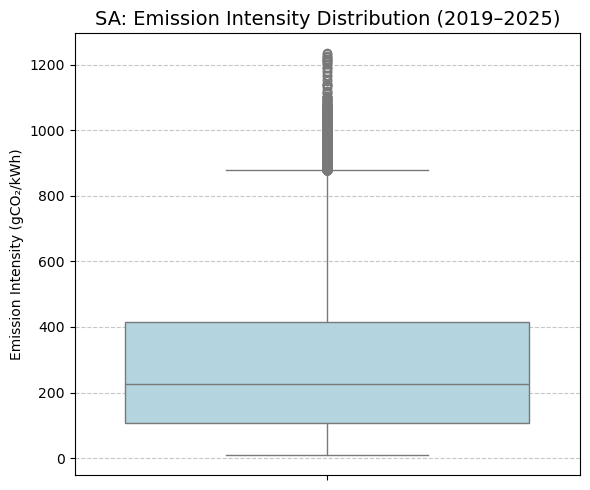

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path



# Convert timestamp to datetime if needed
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Define the correct SA emission column
sa_column = 'csiro.energy.dch.agshop.regional_global_emissions.sa'

# Extract the SA emission data and drop any NaN values
sa_data = df[sa_column].dropna()

# Create the boxplot
plt.figure(figsize=(6, 5))
sns.boxplot(y=sa_data, color='lightblue')
plt.title('SA: Emission Intensity Distribution (2019–2025)', fontsize=14)
plt.ylabel('Emission Intensity (gCO₂/kWh)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


📊 Interpretation of the Boxplot
1. Median Emission Intensity
The dark horizontal line inside the box represents the median (typical emission level).

For SA, this median is relatively low (~220–250 gCO₂/kWh), which indicates generally clean energy.

2. Interquartile Range (IQR)
The height of the box shows the middle 50% of the data.

The narrow IQR shows that most of SA's emission values are tightly clustered, signaling consistency and stability.

3. Whiskers and Outliers
The whiskers stretch to cover the bulk of data points, while the dots above are outliers (occasional spikes).

SA has few extreme outliers, which are well-separated from the main data. This indicates that while spikes can occur (possibly due to sudden fossil-fuel-based generation), they are infrequent.

✅ Business and Policy Implications
Low risk for investors: Stable emissions reduce uncertainty in sustainability KPIs.

Grid reliability: Predictable carbon intensity means SA is well-suited for electric vehicle (EV) adoption, battery charging, and real-time clean energy applications.

Marketing advantage: SA can be positioned as an "all-day clean electricity zone" in Australia.



In [37]:
print(df.columns.tolist())

['timestamp', 'csiro.energy.dch.agshop.regional_global_emissions.nsw', 'csiro.energy.dch.agshop.regional_global_emissions.qld', 'csiro.energy.dch.agshop.regional_global_emissions.sa', 'csiro.energy.dch.agshop.regional_global_emissions.tas', 'csiro.energy.dch.agshop.regional_global_emissions.vic', 'year', 'month', 'day', 'hour', 'minute', 'total_consumption']


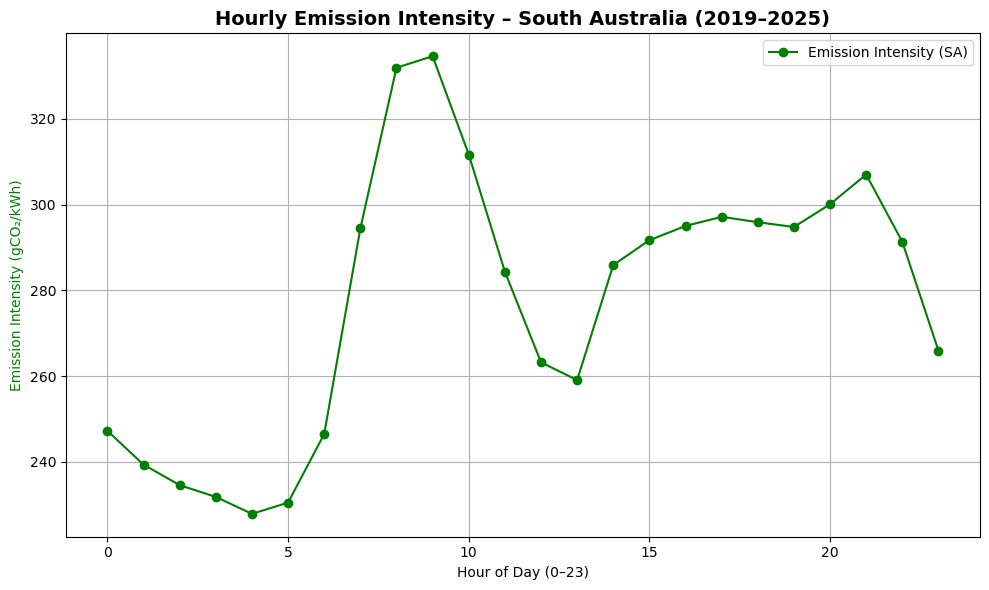

In [38]:
# Ensure timestamp format
df['timestamp'] = pd.to_datetime(df['timestamp'])
df_filtered = df[df['timestamp'].dt.year.isin([2019, 2020, 2021, 2022, 2023, 2024, 2025])]
df_filtered['hour'] = df_filtered['timestamp'].dt.hour

# Emission intensity only
sa_emission_col = 'csiro.energy.dch.agshop.regional_global_emissions.sa'
hourly_emission = df_filtered.groupby('hour')[sa_emission_col].mean()

# Plot
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(hourly_emission.index, hourly_emission.values, color='green', marker='o', label='Emission Intensity (SA)')
plt.xlabel("Hour of Day (0–23)")
plt.ylabel("Emission Intensity (gCO₂/kWh)", color='green')
plt.title("Hourly Emission Intensity – South Australia (2019–2025)", fontsize=14, fontweight='bold')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_1320/3502781214.py:34: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  future_2026 = pd.date_range(start="2026-01-01", end="2026-12-31 23:00", freq="H")


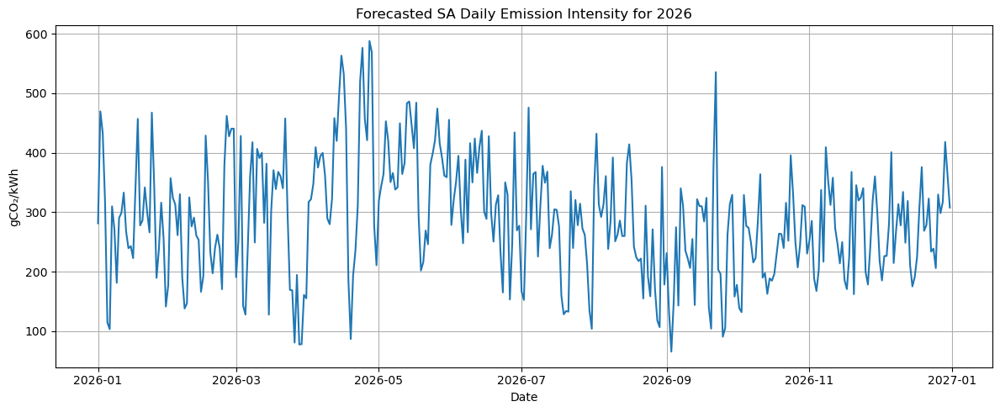

In [1]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from pathlib import Path

# Load the data
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"
df = pd.read_csv(file_path)

# Convert timestamp to datetime and remove timezone
df['timestamp'] = pd.to_datetime(df['timestamp']).dt.tz_localize(None)

# Feature engineering
df['year'] = df['timestamp'].dt.year
df['month'] = df['timestamp'].dt.month
df['day'] = df['timestamp'].dt.day
df['hour'] = df['timestamp'].dt.hour
df['dayofweek'] = df['timestamp'].dt.dayofweek

# Focus on SA region
df['emission'] = df['csiro.energy.dch.agshop.regional_global_emissions.sa']
df = df.dropna(subset=['emission'])

# Features and target
features = ['year', 'month', 'day', 'hour', 'dayofweek']
X_train = df[features]
y_train = df['emission']

# Train Random Forest on all historical data (2019–2025)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 🔮 Generate prediction input for 2026
future_2026 = pd.date_range(start="2026-01-01", end="2026-12-31 23:00", freq="H")
future_df = pd.DataFrame({'timestamp': future_2026})
future_df['year'] = future_df['timestamp'].dt.year
future_df['month'] = future_df['timestamp'].dt.month
future_df['day'] = future_df['timestamp'].dt.day
future_df['hour'] = future_df['timestamp'].dt.hour
future_df['dayofweek'] = future_df['timestamp'].dt.dayofweek

X_future = future_df[features]
future_df['predicted_emission'] = model.predict(X_future)

# 📈 Plot daily average emission for 2026
daily_avg_2026 = future_df.groupby(future_df['timestamp'].dt.date)['predicted_emission'].mean()

plt.figure(figsize=(12, 5))
daily_avg_2026.plot()
plt.title("Forecasted SA Daily Emission Intensity for 2026")
plt.ylabel("gCO₂/kWh")
plt.xlabel("Date")
plt.grid(True)
plt.tight_layout()
plt.show()


/var/folders/zy/70yrs2wx10bdf9kdl2h6mq240000gn/T/ipykernel_1320/1703334603.py:34: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  future_2026 = pd.date_range(start="2026-01-01", end="2026-12-31 23:00", freq="H")


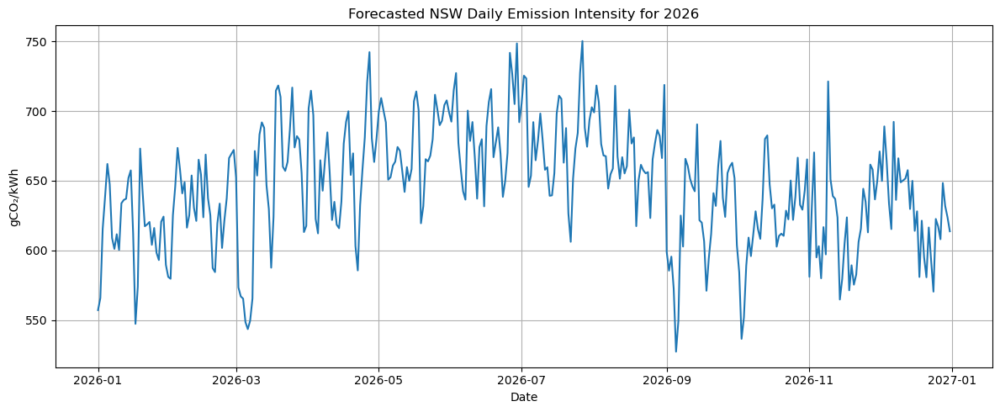

In [2]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from pathlib import Path

# Load the data
file_path = Path.home() / "Desktop" / "dataset_merge" / "Question 2" / "csiro_2019_to_2025.csv"
df = pd.read_csv(file_path)

# Convert timestamp to datetime and remove timezone
df['timestamp'] = pd.to_datetime(df['timestamp']).dt.tz_localize(None)

# Feature engineering
df['year'] = df['timestamp'].dt.year
df['month'] = df['timestamp'].dt.month
df['day'] = df['timestamp'].dt.day
df['hour'] = df['timestamp'].dt.hour
df['dayofweek'] = df['timestamp'].dt.dayofweek

# 🔄 Change focus to NSW region
df['emission'] = df['csiro.energy.dch.agshop.regional_global_emissions.nsw']
df = df.dropna(subset=['emission'])

# Features and target
features = ['year', 'month', 'day', 'hour', 'dayofweek']
X_train = df[features]
y_train = df['emission']

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Generate prediction input for 2026
future_2026 = pd.date_range(start="2026-01-01", end="2026-12-31 23:00", freq="H")
future_df = pd.DataFrame({'timestamp': future_2026})
future_df['year'] = future_df['timestamp'].dt.year
future_df['month'] = future_df['timestamp'].dt.month
future_df['day'] = future_df['timestamp'].dt.day
future_df['hour'] = future_df['timestamp'].dt.hour
future_df['dayofweek'] = future_df['timestamp'].dt.dayofweek

X_future = future_df[features]
future_df['predicted_emission'] = model.predict(X_future)

# Plot daily average emissions
daily_avg_2026 = future_df.groupby(future_df['timestamp'].dt.date)['predicted_emission'].mean()

plt.figure(figsize=(12, 5))
daily_avg_2026.plot()
plt.title("Forecasted NSW Daily Emission Intensity for 2026")
plt.ylabel("gCO₂/kWh")
plt.xlabel("Date")
plt.grid(True)
plt.tight_layout()
plt.show()
